<a href="https://colab.research.google.com/github/satvik-dixit/feature_importance/blob/main/Interpretability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Interpretability of DL-based embeddings




### Importing packages

In [1]:

!git clone -q https://github.com/GasserElbanna/serab-byols.git
!python3 -m pip install -q -e ./serab-byols

!pip install -q tqdm==4.60.0
!pip install -q opensmile
!pip install -q lofo-importance

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 630.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 840.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.6/134.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.4/167.4 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
# code to restart runtime so the packages get installed
import os
os.kill(os.getpid(), 9)

In [77]:
import os
import numpy as np
from tqdm import tqdm
from glob import glob
from random import sample
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
import random
import torch
import opensmile
import serab_byols
import seaborn as sns

from sklearn.svm import SVC, SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, ElasticNet, LinearRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score, GroupShuffleSplit
from sklearn.metrics import classification_report, f1_score, make_scorer, mean_squared_error, r2_score, mean_absolute_error
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
f1 = make_scorer(f1_score, average='weighted')

from lofo import LOFOImportance, Dataset, plot_importance
from lofo.flofo_importance import FLOFOImportance

import warnings
warnings.filterwarnings('ignore')


In [2]:
# Upload kaggle.json to download the EmoDB dataset

! pip install -q kaggle

from google.colab import files
files.upload()

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


# Phase 1: Loading audio files and extracting metadata

Includes downloading the dataset, loading audio files, resampling audio files, extracting metadata



### Defining a function for loading and resampling audio files

In [3]:
# Defining a function for loading and resampling audio files

def load_audio_files(audio_files, resampling_frequency=16000, audio_list=None):
  '''
  Loads and resamples audio files

  Parameters
  ------------
  audio_files: string
      The paths of the wav files
  resampling_frequency: integer
      The frequency which all audios will be resampled to
  audio_list: list
      The list of torch tensors of audios to which more audios need too be added, empty by default

  Returns
  ------------
  audio_list: list
      A list of torch tensors, one array for each audio file

  '''
  # Making audio_list
  if audio_list is None:
    audio_list = []

  # Resampling
  for audio in audio_files:
    signal, fs = librosa.load(audio, sr=resampling_frequency)
    audio_list.append(torch.from_numpy(signal))

  return audio_list


### Loading and resampling audiofiles and collecting metadata on EmoDB dataset

In [4]:
# Load dataset
! kaggle datasets download -q -d piyushagni5/berlin-database-of-emotional-speech-emodb
! unzip -q berlin-database-of-emotional-speech-emodb.zip

# Load and resample audio files
audio_files = glob(os.path.join('/content/wav','*.wav'))
audio_list= load_audio_files(audio_files, resampling_frequency=16000)

# Making speakers list and labels list
speakers = []
labels = []
for audio_file in audio_files:
  file_name = audio_file.split('/')[3]
  speakers.append(int(file_name[:2]))
  labels.append(file_name[5:6])

label_dict = {'A': 'fear', 'L': 'boredom', 'E': 'disgust', 'T': 'sadness', 'W': 'anger', 'N': 'neutral', 'F': 'happiness'}
labels = [label_dict[emotion] for emotion in labels]

# Verify
print('Number of audio files: {}'.format(len(audio_list)))
print('Number of speaker classes: {}'.format(len(set(speakers))))
print('Speaker classes: {}'.format(set(speakers)))
print('Number of speakers: {}'.format(len(speakers)))
print('Number of label classes: {}'.format(len(set(labels))))
print('Label classes: {}'.format(set(labels)))
print('Number of labels: {}'.format(len(labels)))


Number of audio files: 535
Number of speaker classes: 10
Speaker classes: {3, 8, 9, 10, 11, 12, 13, 14, 15, 16}
Number of speakers: 535
Number of label classes: 7
Label classes: {'happiness', 'sadness', 'anger', 'neutral', 'fear', 'disgust', 'boredom'}
Number of labels: 535


# Phase 2: Embedding Extraction
Includes extracting features using
- Deep learning based methods: Hybrid BYOL-S
- DSP based methods: openSMILE compare, openSMILE egemaps

### Audio embeddings extraction functions

In [6]:
# Defining a function for generating audio embedding extraction models

def audio_embeddings_model(model_name):
  '''
  Generates model for embedding extraction

  Parameters
  ------------
  mode_name: string
      The model to used, could be 'hybrid_byols', 'compare' or 'egemaps'

  Returns
  ------------
  model: object
      The embedding extraction model
  '''
  if model_name=='hybrid_byols':
    model_name = 'cvt'
    checkpoint_path = "serab-byols/checkpoints/cvt_s1-d1-e64_s2-d1-e256_s3-d1-e512_BYOLAs64x96-osandbyolaloss6373-e100-bs256-lr0003-rs42.pth"
    model = serab_byols.load_model(checkpoint_path, model_name)
  elif model_name=='compare':
    model = opensmile.Smile(
        feature_set=opensmile.FeatureSet.ComParE_2016,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
  elif model_name=='egemaps':
    model = opensmile.Smile(
        feature_set=opensmile.FeatureSet.eGeMAPSv02,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
  return model


# Defining a function for embedding exctraction from the audio list

def audio_embeddings(audio_list, model_name, model, sampling_rate=16000):
  '''
  Loads and resamples audio files

  Parameters
  ------------
  audio_list: list
      A list of arrays, one array for each audio file
  model_name: string
      The model to used, could be 'hybrid_byols', 'compare' or 'egemaps'
  model: object
      The embedding extraction model generated by audio_embeddings_model function
  sampling_rate: int
      The sampling rate, 16 kHz by default

  Returns
  ------------
  embeddings_array: array
      The array containg embeddings of all audio_files, dimension (number of audio files × n_feats)

  '''
  if model_name=='hybrid_byols':
    embeddings_array = serab_byols.get_scene_embeddings(audio_list, model)
  else:
    embeddings_list = []
    for i in tqdm(range(len(audio_list))):
      embeddings = model.process_signal(audio_list[i], sampling_rate)
      embeddings_list.append(torch.tensor(embeddings.values[0], dtype=torch.float32))
    embeddings_array = torch.stack(embeddings_list)
  return embeddings_array


def get_egemaps_feature_names():
  model = opensmile.Smile(
      feature_set=opensmile.FeatureSet.eGeMAPSv02,
      feature_level=opensmile.FeatureLevel.Functionals,
  )
  egemaps_feature_names = model.column_names
  return egemaps_feature_names



### Audio embeddings extraction on EmoDB

In [7]:

# Hybrid BYOLS
model = audio_embeddings_model(model_name='hybrid_byols')
embeddings_array_byols = audio_embeddings(audio_list, model_name='hybrid_byols', model=model)

# # EmoDB compare
# model = audio_embeddings_model(model_name='compare')
# embeddings_array_compare = audio_embeddings(audio_list, model_name='compare', model=model)

# EmoDB egemaps
model = audio_embeddings_model(model_name='egemaps')
embeddings_array_egemaps = audio_embeddings(audio_list, model_name='egemaps', model=model)

# ---------------------------------------------------------------------------------------------------

egemaps_feature_names = get_egemaps_feature_names()

# Verify Phase_2
models = ['hybrid_byols', 'egemaps']
embeddings_arrays = {'hybrid_byols': embeddings_array_byols, 'egemaps':embeddings_array_egemaps}

for model in models:
  print()
  print()
  print('MODEL: {}'.format(model))
  print()
  print('The shape of the embeddings array is {}'.format(embeddings_arrays[model].shape))
  print('The embeddings array is: ')
  print((embeddings_arrays[model]))


100%|██████████| 535/535 [01:28<00:00,  6.07it/s]




MODEL: hybrid_byols

The shape of the embeddings array is torch.Size([535, 2048])
The embeddings array is: 
tensor([[ 4.4898,  4.0828, -0.0232,  ...,  4.3089,  0.3653,  3.6960],
        [ 5.5312,  4.6465,  1.3829,  ...,  4.6812,  0.2519,  2.7148],
        [ 3.6403,  4.2513,  0.4691,  ...,  4.8753, -1.8229,  2.9601],
        ...,
        [ 4.0060,  5.5239,  0.5199,  ...,  4.1817, -0.2943,  3.0612],
        [ 6.5560,  4.3922,  1.4386,  ...,  4.8985, -1.3828,  3.6181],
        [ 6.5376,  4.5295,  0.8657,  ...,  4.8943, -0.4302,  3.8170]])


MODEL: egemaps

The shape of the embeddings array is torch.Size([535, 88])
The embeddings array is: 
tensor([[ 2.0655e+01,  1.3430e-01,  1.8329e+01,  ...,  1.1333e-01,
          6.0736e-02, -1.5720e+01],
        [ 3.8349e+01,  4.8998e-02,  3.6780e+01,  ...,  8.2727e-02,
          6.9947e-02, -1.9092e+01],
        [ 2.3695e+01,  8.6747e-02,  2.1824e+01,  ...,  1.8600e-01,
          2.1892e-01, -1.9747e+01],
        ...,
        [ 3.0038e+01,  1.6524e-

# Classification and Feature Importance Functions


In [11]:
# function for dividing the dataset into dictionaries with emotions as keys and embeddings/labels/speakers as values

def label_division(embeddings_array, labels, required_labels, speakers):
    final_embeddings_dict = {}
    final_labels_dict = {}
    final_speakers_list_dict = {}

    for label in required_labels:
        label_indices = np.where(np.array(labels) == label)[0]
        label_embeddings = embeddings_array[label_indices, :]
        final_speakers_list_dict[label] = list(np.array(speakers)[label_indices])
        final_embeddings_dict[label] = label_embeddings
        final_labels_dict[label] = [label] * len(label_indices)

    return final_embeddings_dict, final_labels_dict, final_speakers_list_dict


In [12]:
# function for combining one emotion (50%) and the rest of the 5 emotions (10% each)

def emotion_all_merger(emotion, other_emotions, embeddings_dict, speakers_dict, num=45):

  np.random.seed(42)

  emo_indices = np.random.choice(len(speakers_dict[emotion]), size=num, replace=False)

  embeddings = embeddings_dict[emotion][emo_indices]
  speakers = [speakers_dict[emotion][i] for i in emo_indices]
  labels = [emotion]*num

  for em in other_emotions:
    em_indices = np.random.choice(len(speakers_dict[em]), size=int(num/len(other_emotions)), replace=False)
    em_speakers = [speakers_dict[em][i] for i in em_indices]
    embeddings_e = embeddings_dict[em][em_indices]

    embeddings = np.concatenate((embeddings, embeddings_e), axis=0)
    speakers = speakers + em_speakers
    labels = labels + ['X']*int(num/len(other_emotions))

  return embeddings, labels, speakers


In [14]:
def permutation_importance_method(X, y, feature_names):
  model = KNeighborsClassifier()
  model.fit(X, y)
  results = permutation_importance(model, X, y, scoring=f1, n_repeats=10, random_state=42)
  importances = results.importances_mean
  importance_list = [(feature_names[idx], importance) for idx, importance in enumerate(importances)]
  sorted_importances = sorted(importance_list, key=lambda x: x[1], reverse=True)
  return sorted_importances


In [15]:
def feature_importance_method(X, y, feature_names, trained_model):
  coef_abs = abs(trained_model.coef_[0])
  feature_indices = np.argsort(coef_abs)[::-1]
  sorted_importances = [(feature_names[i], coef_abs[i]) for i in feature_indices]
  return sorted_importances


In [53]:
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']
Performance ={'Egemaps':{e:[] for e in emotions}, 'Hybrid_Byols_2048':{e:[] for e in emotions}, 'Hybrid_Byols_top_features':{e:[] for e in emotions}}

def classification_pipeline(embeddings, speakers, labels_list, feature_names):

    np.random.seed(42)

    X = embeddings
    y = labels_list
    groups = speakers

    # Define the hyperparameter grid for GridSearchCV
    param_grid = {'C': [1], 'l1_ratio': [0]}

    # Outer cross-validation loop
    outer_cv = GroupShuffleSplit(n_splits=2, train_size=0.7, random_state=42)
    outer_scores = []
    feats_array = []
    for train_index, test_index in outer_cv.split(X, y, groups):

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = [y[i] for i in train_index], [y[i] for i in test_index]

        # Inner cross-validation loop for hyperparameter tuning
        inner_cv = GroupShuffleSplit(n_splits=3, train_size=0.7, random_state=42)
        grid_search = GridSearchCV(LogisticRegression(solver='saga', penalty = 'elasticnet'), param_grid, cv=inner_cv)
        grid_search.fit(X_train, y_train, groups=[groups[i] for i in train_index])

        # Get the best hyperparameters found in the inner loop
        best_params = grid_search.best_params_

        # Fit the model with the best hyperparameters on the training data
        model = LogisticRegression(solver='saga', penalty = 'elasticnet', **best_params)

        # Standardize X_train and transform X_test
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        model.fit(X_train, y_train)

        # Evaluate the model on the test data
        y_pred = model.predict(X_test)
        score = f1_score(y_test, y_pred, average='weighted')
        outer_scores.append(score)

    # Compute and print the mean F1 score across all outer folds
    mean_f1 = np.mean(outer_scores)
    return model, mean_f1



# LOFO


In [24]:

def lofo_plot(embeddings_array, labels, feature_names, frac, e):

  y=[]
  for label in labels:
    if label==e:
      y.append(1)
    else:
      y.append(0)

  df = pd.DataFrame(embeddings_array)
  df.columns = feature_names
  df['Results'] = y

  sample_df = df.sample(frac=frac, random_state=42)
  cv = KFold(n_splits=4, shuffle=False, random_state=None) # check
  dataset = Dataset(df=sample_df, target='Results', features=feature_names, auto_group_threshold=0.80) # check

  # model = LogisticRegression(solver='saga', penalty = 'elasticnet')
  model = LogisticRegression()
  param_grid = {'C': [0.1, 1, 10]}

  # lofo_imp = LOFOImportance(dataset, "roc_auc", model,  param_grid, cv) # check
  lofo_imp = LOFOImportance(dataset=dataset, scoring="roc_auc", model=model, fit_params=None, cv=4)
  importance_df = lofo_imp.get_importance()
  plot_importance(importance_df, figsize=(12, 20))

  return importance_df


In [20]:

def flofo_plot(trained_model, embeddings_array, labels, feature_names, frac, e):

  y=[]
  for label in labels:
    if label==e:
      y.append(1)
    else:
      y.append(0)

  df = pd.DataFrame(embeddings_array)
  df.columns = feature_names
  df['Results'] = y

  lofo_imp = FLOFOImportance(trained_model=trained_model, validation_df=df, features=feature_names, target = 'binary_target', scoring ="roc_auc" )
  importance_df = lofo_imp.get_importance()

  return importance_df


# EGEMAPS

In [21]:
egemaps_embeddings_dict, egemaps_labels_dict, egemaps_speakers_list_dict = label_division(embeddings_array=embeddings_array_egemaps, labels=labels, required_labels=['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust'], speakers=speakers)


In [22]:
print(egemaps_embeddings_dict)
print(egemaps_labels_dict)
print(egemaps_speakers_list_dict)

{'anger': tensor([[ 4.3027e+01,  1.2202e-01,  3.8160e+01,  ...,  7.2222e-02,
          6.7293e-02, -2.3284e+01],
        [ 3.3464e+01,  1.3038e-01,  3.0155e+01,  ...,  8.9167e-02,
          5.6193e-02, -2.0187e+01],
        [ 3.5205e+01,  1.4895e-01,  3.0809e+01,  ...,  1.2091e-01,
          5.5833e-02, -2.0696e+01],
        ...,
        [ 3.7857e+01,  9.9005e-02,  3.5355e+01,  ...,  1.1400e-01,
          6.9455e-02, -2.2807e+01],
        [ 3.3884e+01,  1.1834e-01,  3.1092e+01,  ...,  7.5000e-02,
          3.6742e-02, -2.1015e+01],
        [ 4.0543e+01,  9.0766e-02,  3.8127e+01,  ...,  3.6250e-02,
          1.4948e-02, -1.7267e+01]]), 'fear': tensor([[ 3.8349e+01,  4.8998e-02,  3.6780e+01,  ...,  8.2727e-02,
          6.9947e-02, -1.9092e+01],
        [ 2.8941e+01,  1.0009e-01,  2.7871e+01,  ...,  6.5000e-02,
          4.0559e-02, -1.8273e+01],
        [ 3.3673e+01,  8.1080e-02,  3.1747e+01,  ...,  6.3750e-02,
          2.3947e-02, -1.7275e+01],
        ...,
        [ 4.2614e+01,  7.55

anger
---------------------------------------------------------------------

[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]
Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'F1amplitudeLogRelF0_sma3nz_amean', 'F1amplitudeLogRelF0_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean', 'F2amplitudeLogRelF0_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_amean', 'F3amplitudeLogRelF0_sma3nz_stddevNorm', 'alphaRatioV_sma3nz_amean', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF

  0%|          | 0/53 [00:00<?, ?it/s]

[('HNRdBACF_sma3nz_amean', 0.7532058), ('slopeUV0-500_sma3nz_amean', 0.61040014), ('slopeV0-500_sma3nz_amean', 0.56820846), ('mfcc1_sma3_stddevNorm', 0.50102526), ('mfcc1_sma3_amean', 0.47118464), ('mfcc3_sma3_stddevNorm', 0.4395594), ('F2frequency_sma3nz_amean', 0.38571924), ('mfcc4V_sma3nz_stddevNorm', 0.38256323), ('logRelF0-H1-H2_sma3nz_stddevNorm', 0.35709468), ('loudness_sma3_meanFallingSlope', 0.33881325), ('slopeUV500-1500_sma3nz_amean', 0.33314466), ('mfcc2V_sma3nz_stddevNorm', 0.31956583), ('spectralFluxUV_sma3nz_amean', 0.3113721), ('loudness_sma3_percentile20.0', 0.27892584), ('F1bandwidth_sma3nz_stddevNorm', 0.27445307), ('mfcc2V_sma3nz_amean', 0.27338174), ('HNRdBACF_sma3nz_stddevNorm', 0.26150304), ('mfcc4V_sma3nz_amean', 0.25279218), ('equivalentSoundLevel_dBp', 0.20768799), ('alphaRatioV_sma3nz_amean', 0.19711646), ('alphaRatioV_sma3nz_stddevNorm', 0.18525106), ('shimmerLocaldB_sma3nz_amean', 0.1611858), ('logRelF0-H1-H2_sma3nz_amean', 0.14475867), ('mfcc3V_sma3nz_stdd

  0%|          | 0/56 [00:00<?, ?it/s]

[('jitterLocal_sma3nz_stddevNorm', 0.20904362), ('F0semitoneFrom27.5Hz_sma3nz_stddevNorm', 0.098672464), ('F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2', 0.034997765), ('shimmerLocaldB_sma3nz_stddevNorm', 0.0038237195), ('equivalentSoundLevel_dBp', 0.0), ('shimmerLocaldB_sma3nz_amean', 0.0), ('mfcc2_sma3_amean', 0.0), ('mfcc2_sma3_stddevNorm', 0.0), ('mfcc3_sma3_amean', 0.0), ('mfcc3_sma3_stddevNorm', 0.0), ('mfcc4_sma3_amean', 0.0), ('mfcc4_sma3_stddevNorm', 0.0), ('jitterLocal_sma3nz_amean', 0.0), ('HNRdBACF_sma3nz_amean', 0.0), ('mfcc1_sma3_amean', 0.0), ('HNRdBACF_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-H2_sma3nz_amean', 0.0), ('logRelF0-H1-H2_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-A3_sma3nz_amean', 0.0), ('logRelF0-H1-A3_sma3nz_stddevNorm', 0.0), ('F1frequency_sma3nz_amean', 0.0), ('F1frequency_sma3nz_stddevNorm', 0.0), ('mfcc1_sma3_stddevNorm', 0.0), ('spectralFlux_sma3_stddevNorm', 0.0), ('StddevUnvoicedSegmentLength', 0.0), ('spectralFlux_sma3_amean', 0.0), ('F0semitoneFrom27.5Hz_

  0%|          | 0/59 [00:00<?, ?it/s]

[('mfcc1_sma3_amean', 0.7266424), ('loudnessPeaksPerSec', 0.15930343), ('jitterLocal_sma3nz_stddevNorm', 0.0), ('mfcc1_sma3_stddevNorm', 0.0), ('mfcc2_sma3_amean', 0.0), ('mfcc2_sma3_stddevNorm', 0.0), ('mfcc3_sma3_amean', 0.0), ('mfcc3_sma3_stddevNorm', 0.0), ('mfcc4_sma3_amean', 0.0), ('mfcc4_sma3_stddevNorm', 0.0), ('jitterLocal_sma3nz_amean', 0.0), ('equivalentSoundLevel_dBp', 0.0), ('spectralFlux_sma3_stddevNorm', 0.0), ('shimmerLocaldB_sma3nz_stddevNorm', 0.0), ('HNRdBACF_sma3nz_amean', 0.0), ('HNRdBACF_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-H2_sma3nz_amean', 0.0), ('logRelF0-H1-H2_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-A3_sma3nz_amean', 0.0), ('logRelF0-H1-A3_sma3nz_stddevNorm', 0.0), ('F1frequency_sma3nz_amean', 0.0), ('shimmerLocaldB_sma3nz_amean', 0.0), ('spectralFlux_sma3_amean', 0.0), ('F1bandwidth_sma3nz_amean', 0.0), ('F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope', 0.0), ('F0semitoneFrom27.5Hz_sma3nz_stddevNorm', 0.0), ('F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 0.

  0%|          | 0/49 [00:00<?, ?it/s]

[('mfcc3V_sma3nz_amean', 0.5351136), ('mfcc2V_sma3nz_amean', 0.1222627), ('equivalentSoundLevel_dBp', 0.0), ('jitterLocal_sma3nz_amean', 0.0), ('mfcc1_sma3_stddevNorm', 0.0), ('mfcc2_sma3_amean', 0.0), ('mfcc2_sma3_stddevNorm', 0.0), ('mfcc3_sma3_amean', 0.0), ('mfcc3_sma3_stddevNorm', 0.0), ('mfcc4_sma3_amean', 0.0), ('mfcc4_sma3_stddevNorm', 0.0), ('jitterLocal_sma3nz_stddevNorm', 0.0), ('spectralFlux_sma3_stddevNorm', 0.0), ('shimmerLocaldB_sma3nz_amean', 0.0), ('shimmerLocaldB_sma3nz_stddevNorm', 0.0), ('HNRdBACF_sma3nz_amean', 0.0), ('HNRdBACF_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-H2_sma3nz_amean', 0.0), ('logRelF0-H1-H2_sma3nz_stddevNorm', 0.0), ('logRelF0-H1-A3_sma3nz_amean', 0.0), ('logRelF0-H1-A3_sma3nz_stddevNorm', 0.0), ('F1frequency_sma3nz_amean', 0.0), ('mfcc1_sma3_amean', 0.0), ('loudness_sma3_stddevFallingSlope', 0.0), ('spectralFlux_sma3_amean', 0.0), ('F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope', 0.0), ('F0semitoneFrom27.5Hz_sma3nz_stddevNorm', 0.0), ('F0semitone

  0%|          | 0/47 [00:00<?, ?it/s]

[('VoicedSegmentsPerSec', 0.50382406), ('slopeV0-500_sma3nz_amean', 0.46933225), ('StddevUnvoicedSegmentLength', 0.44084463), ('F3frequency_sma3nz_amean', 0.4349825), ('F2frequency_sma3nz_stddevNorm', 0.43420678), ('MeanUnvoicedSegmentLength', 0.4072674), ('slopeUV0-500_sma3nz_amean', 0.35246924), ('hammarbergIndexV_sma3nz_amean', 0.33356386), ('alphaRatioV_sma3nz_amean', 0.2847153), ('F1amplitudeLogRelF0_sma3nz_amean', 0.26843226), ('F1amplitudeLogRelF0_sma3nz_stddevNorm', 0.26334023), ('F1frequency_sma3nz_amean', 0.25402752), ('F3frequency_sma3nz_stddevNorm', 0.242561), ('F2frequency_sma3nz_amean', 0.1966962), ('mfcc3V_sma3nz_amean', 0.18598454), ('mfcc4V_sma3nz_amean', 0.18397053), ('F2amplitudeLogRelF0_sma3nz_amean', 0.18303657), ('F3amplitudeLogRelF0_sma3nz_amean', 0.16470136), ('F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 0.12587091), ('F2amplitudeLogRelF0_sma3nz_stddevNorm', 0.09635204), ('mfcc2V_sma3nz_amean', 0.09133719), ('loudness_sma3_amean', 0.08862277), ('F0semitoneFrom2

  0%|          | 0/51 [00:00<?, ?it/s]

[('slopeV0-500_sma3nz_amean', 0.646465), ('loudnessPeaksPerSec', 0.5811241), ('F1frequency_sma3nz_stddevNorm', 0.5738043), ('loudness_sma3_stddevFallingSlope', 0.5103204), ('F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2', 0.45666173), ('shimmerLocaldB_sma3nz_amean', 0.45479786), ('mfcc4_sma3_amean', 0.4447391), ('loudness_sma3_meanFallingSlope', 0.4171534), ('loudness_sma3_pctlrange0-2', 0.36961824), ('VoicedSegmentsPerSec', 0.35226578), ('MeanUnvoicedSegmentLength', 0.30672067), ('F1frequency_sma3nz_amean', 0.29155743), ('slopeV0-500_sma3nz_stddevNorm', 0.2907679), ('loudness_sma3_meanRisingSlope', 0.25774017), ('StddevUnvoicedSegmentLength', 0.19353434), ('F2frequency_sma3nz_amean', 0.19194046), ('mfcc1_sma3_amean', 0.1907287), ('F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 0.18804556), ('F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope', 0.17695898), ('mfcc3V_sma3nz_amean', 0.16295326), ('alphaRatioV_sma3nz_amean', 0.1596176), ('F2bandwidth_sma3nz_amean', 0.14812955), ('F0semitoneFrom27.5Hz_

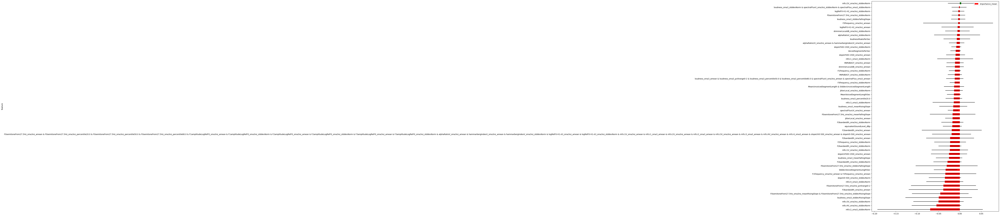

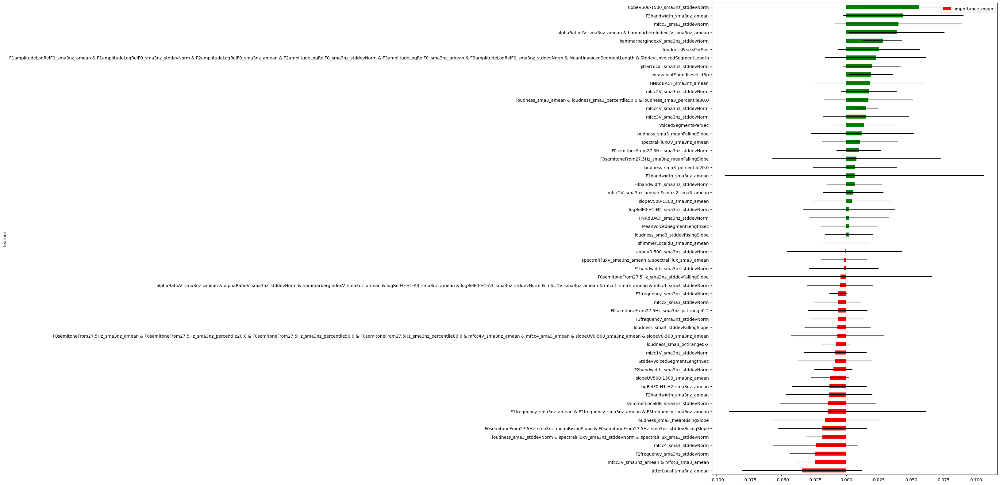

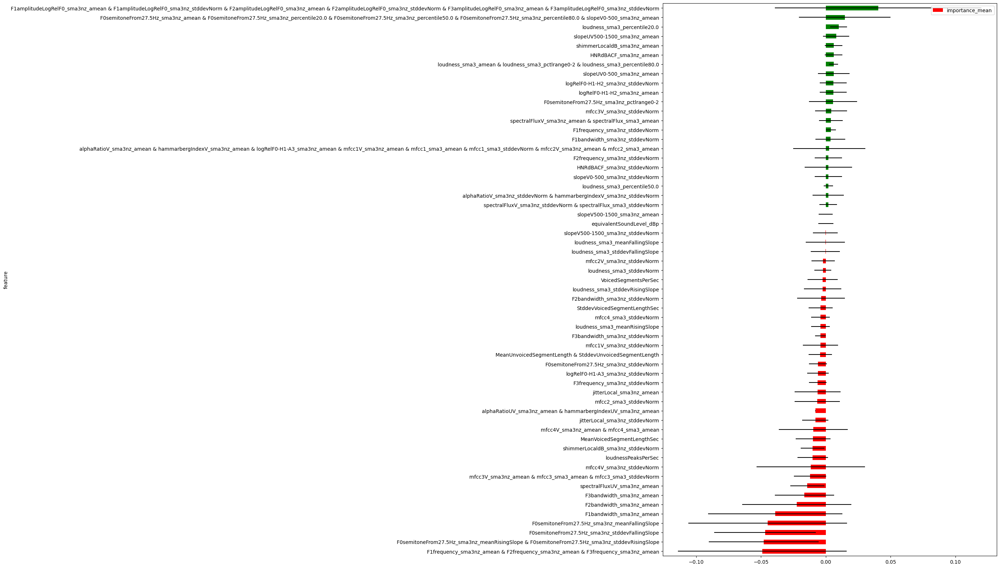

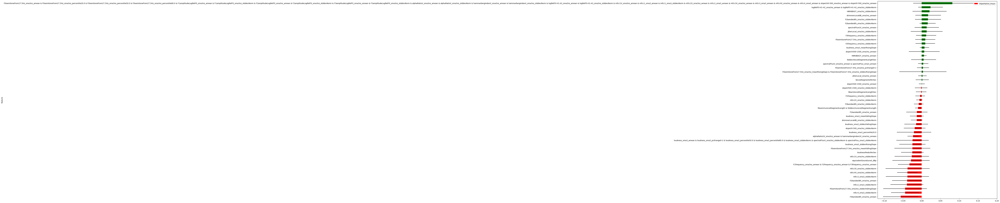

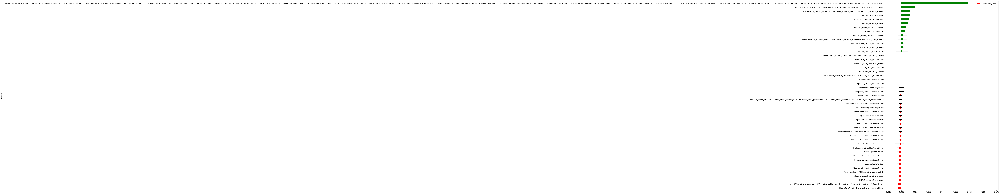

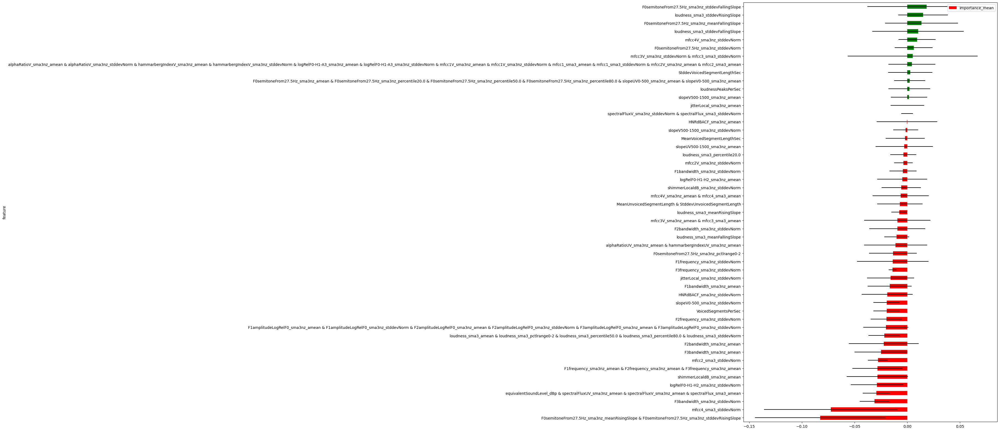

In [25]:

egemaps_fi_dict = {}
egemaps_top_fi_features = {}
egemaps_top_features = {}
lofo_dict = {}
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

for e in emotions:

  print(e)
  print('---------------------------------------------------------------------')
  print()

  ege_embeddings, ege_labels, ege_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=egemaps_embeddings_dict, speakers_dict=egemaps_speakers_list_dict, num=45)

  trained_model, result = classification_pipeline(embeddings=ege_embeddings, speakers=ege_speakers, labels_list=ege_labels, feature_names=egemaps_feature_names)
  Performance['Egemaps'][e] = result

  fi = feature_importance_method(X=ege_embeddings, y=ege_labels, feature_names=egemaps_feature_names, trained_model=trained_model)
  egemaps_fi_dict[e] = [list(egemaps_feature_names).index(tup[0]) for tup in fi]
  egemaps_top_fi_features[e] = [tup[0] for tup in fi]

  lofo_df = lofo_plot(embeddings_array=ege_embeddings, labels=ege_labels, feature_names=egemaps_feature_names, frac=1.0, e=e)
  lofo_df.round(3)
  lofo_dict[e] = lofo_df

  print(fi)
  print()
  print()


## LOFO results

In [26]:
lofo_dict[emotions[0]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
22,mfcc2V_sma3nz_stddevNorm,0.003099,0.030836,1.110223e-16,0.045455,0.008264,-0.041322
49,loudness_sma3_stddevNorm & spectralFluxV_sma3n...,-0.001722,0.017351,1.515152e-02,-0.030303,0.008264,0.000000
35,logRelF0-H1-H2_sma3nz_stddevNorm,-0.003444,0.014139,-7.575758e-03,-0.022727,0.000000,0.016529
21,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,-0.003444,0.015870,0.000000e+00,-0.030303,0.008264,0.008264
13,loudness_sma3_stddevFallingSlope,-0.003788,0.016511,1.515152e-02,-0.030303,0.000000,0.000000
12,F3frequency_sma3nz_amean,-0.003960,0.081675,4.545455e-02,-0.143939,0.024793,0.057851
19,logRelF0-H1-H2_sma3nz_amean,-0.005165,0.037661,2.272727e-02,-0.068182,0.000000,0.024793
25,shimmerLocaldB_sma3nz_stddevNorm,-0.005510,0.028617,2.272727e-02,-0.053030,0.000000,0.008264
23,alphaRatioV_sma3nz_stddevNorm,-0.006371,0.053634,7.575758e-03,-0.090909,0.000000,0.057851
18,loudnessPeaksPerSec,-0.007059,0.031115,7.575758e-03,-0.060606,0.008264,0.016529


In [27]:
print(lofo_dict[emotions[0]].head(10).iloc[:, 0])

22                             mfcc2V_sma3nz_stddevNorm
49    loudness_sma3_stddevNorm & spectralFluxV_sma3n...
35                     logRelF0-H1-H2_sma3nz_stddevNorm
21               F0semitoneFrom27.5Hz_sma3nz_stddevNorm
13                     loudness_sma3_stddevFallingSlope
12                             F3frequency_sma3nz_amean
19                          logRelF0-H1-H2_sma3nz_amean
25                     shimmerLocaldB_sma3nz_stddevNorm
23                        alphaRatioV_sma3nz_stddevNorm
18                                  loudnessPeaksPerSec
Name: feature, dtype: object


In [28]:
lofo_dict[emotions[1]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
40,slopeV500-1500_sma3nz_stddevNorm,0.056129,0.040877,4.545455e-02,0.121212,0.049587,0.008264
25,F3bandwidth_sma3nz_amean,0.043905,0.046462,4.545455e-02,0.113636,-0.016529,0.033058
7,mfcc3_sma3_stddevNorm,0.040289,0.048965,1.515152e-02,0.121212,0.033058,-0.008264
55,alphaRatioUV_sma3nz_amean & hammarbergIndexUV_...,0.038740,0.036884,-1.110223e-16,0.022727,0.033058,0.099174
22,hammarbergIndexV_sma3nz_stddevNorm,0.028065,0.014989,7.575758e-03,0.030303,0.049587,0.024793
17,loudnessPeaksPerSec,0.025310,0.031551,4.545455e-02,0.022727,-0.024793,0.057851
54,F1amplitudeLogRelF0_sma3nz_amean & F1amplitude...,0.022727,0.039014,1.515152e-02,0.075758,-0.033058,0.033058
32,jitterLocal_sma3nz_stddevNorm,0.019800,0.021992,3.030303e-02,0.007576,0.049587,-0.008264
31,equivalentSoundLevel_dBp,0.019284,0.016933,3.787879e-02,0.022727,-0.008264,0.024793
41,HNRdBACF_sma3nz_amean,0.018251,0.042134,3.030303e-02,0.075758,0.008264,-0.041322


In [29]:
lofo_dict[emotions[2]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
55,F1amplitudeLogRelF0_sma3nz_amean & F1amplitude...,0.040461,0.079696,0.068182,0.060606,-0.090909,0.123967
46,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.014635,0.035236,0.037879,-0.045455,0.024793,0.041322
8,loudness_sma3_percentile20.0,0.009986,0.006561,0.015152,0.000000,0.008264,0.016529
38,slopeUV500-1500_sma3nz_amean,0.008092,0.010126,0.007576,0.000000,0.000000,0.024793
26,shimmerLocaldB_sma3nz_amean,0.006026,0.006807,0.007576,0.000000,0.000000,0.016529
42,HNRdBACF_sma3nz_amean,0.006026,0.006807,0.000000,0.007576,0.000000,0.016529
48,loudness_sma3_amean & loudness_sma3_pctlrange0...,0.006026,0.003491,0.007576,0.000000,0.008264,0.008264
12,slopeUV0-500_sma3nz_amean,0.006026,0.012198,0.007576,0.000000,-0.008264,0.024793
35,logRelF0-H1-H2_sma3nz_stddevNorm,0.005854,0.010416,0.015152,0.000000,-0.008264,0.016529
19,logRelF0-H1-H2_sma3nz_amean,0.005854,0.010416,0.015152,0.000000,-0.008264,0.016529


In [30]:
lofo_dict[emotions[3]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
41,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.081784,0.104372,0.219697,0.090909,0.090909,-7.438017e-02
45,logRelF0-H1-H2_sma3nz_amean & logRelF0-H1-H2_s...,0.023416,0.032871,-0.015152,0.075758,0.016529,1.652893e-02
35,HNRdBACF_sma3nz_stddevNorm,0.020833,0.045257,-0.015152,0.098485,0.000000,0.000000e+00
24,shimmerLocaldB_sma3nz_amean,0.017045,0.034038,-0.007576,0.075758,0.000000,0.000000e+00
27,F1bandwidth_sma3nz_stddevNorm,0.016701,0.034704,0.007576,0.075758,-0.008264,-8.264463e-03
26,F2bandwidth_sma3nz_stddevNorm,0.015840,0.021439,-0.015152,0.045455,0.016529,1.652893e-02
40,spectralFluxUV_sma3nz_amean,0.013258,0.032308,-0.015152,0.068182,0.000000,1.110223e-16
29,jitterLocal_sma3nz_stddevNorm,0.013258,0.042307,-0.030303,0.083333,0.000000,0.000000e+00
14,F3frequency_sma3nz_stddevNorm,0.011708,0.027005,-0.022727,0.053030,0.008264,8.264463e-03
19,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0.009470,0.026550,-0.015152,0.053030,0.008264,-8.264463e-03


In [31]:
lofo_dict[emotions[4]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
39,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.122762,0.046508,0.159091,0.166667,0.115702,0.049587
40,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope & ...,0.024621,0.047121,0.106061,-0.007576,0.000000,0.000000
45,F1frequency_sma3nz_amean & F2frequency_sma3nz_...,0.015840,0.012875,0.022727,0.007576,0.033058,0.000000
19,F3bandwidth_sma3nz_amean,0.015668,0.020954,0.045455,-0.007576,0.024793,0.000000
3,slopeV0-500_sma3nz_stddevNorm,0.013430,0.028502,0.060606,-0.015152,0.008264,0.000000
5,F2bandwidth_sma3nz_amean,0.011364,0.024254,0.053030,-0.007576,0.000000,0.000000
36,loudness_sma3_meanFallingSlope,0.007576,0.009278,0.022727,0.007576,0.000000,0.000000
27,mfcc4_sma3_stddevNorm,0.006026,0.006807,0.000000,0.007576,0.016529,0.000000
9,loudness_sma3_stddevFallingSlope,0.002238,0.008811,-0.007576,0.000000,0.016529,0.000000
42,spectralFluxUV_sma3nz_amean & spectralFluxV_sm...,0.002238,0.008811,-0.007576,0.000000,0.016529,0.000000


In [32]:
lofo_dict[emotions[5]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
31,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,0.018251,0.056182,0.015152,0.090909,0.033058,-6.611570e-02
22,loudness_sma3_stddevRisingSlope,0.014979,0.023519,0.015152,0.053030,0.000000,-8.264463e-03
20,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,0.013430,0.034588,-0.022727,0.068182,0.016529,-8.264463e-03
9,loudness_sma3_stddevFallingSlope,0.010158,0.043447,0.022727,0.075758,-0.033058,-2.479339e-02
13,mfcc4V_sma3nz_stddevNorm,0.009125,0.017595,0.022727,0.030303,-0.008264,-8.264463e-03
16,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0.006026,0.017915,-0.015152,0.022727,0.024793,-8.264463e-03
45,mfcc3V_sma3nz_stddevNorm & mfcc3_sma3_stddevNorm,0.005165,0.061556,-0.060606,0.106061,-0.008264,-1.652893e-02
43,alphaRatioV_sma3nz_amean & alphaRatioV_sma3nz_...,0.004304,0.022223,0.022727,-0.030303,0.024793,1.110223e-16
8,StddevVoicedSegmentLengthSec,0.002755,0.021070,-0.030303,0.000000,0.016529,2.479339e-02
38,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.002238,0.014686,-0.022727,0.015152,0.008264,8.264463e-03


## Important egemaps features (according to coef)

In [33]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[0]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,HNRdBACF_sma3nz_amean
1,slopeUV0-500_sma3nz_amean
2,slopeV0-500_sma3nz_amean
3,mfcc1_sma3_stddevNorm
4,mfcc1_sma3_amean
5,mfcc3_sma3_stddevNorm
6,F2frequency_sma3nz_amean
7,mfcc4V_sma3nz_stddevNorm
8,logRelF0-H1-H2_sma3nz_stddevNorm
9,loudness_sma3_meanFallingSlope


In [34]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[1]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,jitterLocal_sma3nz_stddevNorm
1,F0semitoneFrom27.5Hz_sma3nz_stddevNorm
2,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
3,shimmerLocaldB_sma3nz_stddevNorm
4,equivalentSoundLevel_dBp
5,shimmerLocaldB_sma3nz_amean
6,mfcc2_sma3_amean
7,mfcc2_sma3_stddevNorm
8,mfcc3_sma3_amean
9,mfcc3_sma3_stddevNorm


In [35]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[2]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,mfcc1_sma3_amean
1,loudnessPeaksPerSec
2,jitterLocal_sma3nz_stddevNorm
3,mfcc1_sma3_stddevNorm
4,mfcc2_sma3_amean
5,mfcc2_sma3_stddevNorm
6,mfcc3_sma3_amean
7,mfcc3_sma3_stddevNorm
8,mfcc4_sma3_amean
9,mfcc4_sma3_stddevNorm


In [36]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[3]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,mfcc3V_sma3nz_amean
1,mfcc2V_sma3nz_amean
2,equivalentSoundLevel_dBp
3,jitterLocal_sma3nz_amean
4,mfcc1_sma3_stddevNorm
5,mfcc2_sma3_amean
6,mfcc2_sma3_stddevNorm
7,mfcc3_sma3_amean
8,mfcc3_sma3_stddevNorm
9,mfcc4_sma3_amean


In [37]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[4]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,VoicedSegmentsPerSec
1,slopeV0-500_sma3nz_amean
2,StddevUnvoicedSegmentLength
3,F3frequency_sma3nz_amean
4,F2frequency_sma3nz_stddevNorm
5,MeanUnvoicedSegmentLength
6,slopeUV0-500_sma3nz_amean
7,hammarbergIndexV_sma3nz_amean
8,alphaRatioV_sma3nz_amean
9,F1amplitudeLogRelF0_sma3nz_amean


In [38]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[5]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,slopeV0-500_sma3nz_amean
1,loudnessPeaksPerSec
2,F1frequency_sma3nz_stddevNorm
3,loudness_sma3_stddevFallingSlope
4,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
5,shimmerLocaldB_sma3nz_amean
6,mfcc4_sma3_amean
7,loudness_sma3_meanFallingSlope
8,loudness_sma3_pctlrange0-2
9,VoicedSegmentsPerSec


In [39]:
def find_x_at_n_percentile(x_values, y_values, n):
    percentile = np.percentile(y_values, n)
    for i, y in enumerate(y_values):
        if y >= percentile:
            x_at_nth_percentile = x_values[i]
            break

    return x_at_nth_percentile

# Hybrid BYOLS

In [40]:
byols_embeddings_dict, byols_labels_dict, byols_speakers_list_dict = label_division(embeddings_array=embeddings_array_byols, labels=labels, required_labels=['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust'], speakers=speakers)


In [41]:
print(byols_embeddings_dict)
print(byols_labels_dict)
print(byols_speakers_list_dict)

{'anger': tensor([[ 5.4157,  3.3348,  1.7150,  ...,  3.9454, -0.4432,  2.8843],
        [ 6.6437,  5.9029,  1.5498,  ...,  3.8532, -0.6760,  4.0496],
        [ 5.4992,  4.1236,  1.4094,  ...,  5.8973, -2.0543,  3.6085],
        ...,
        [ 4.6339,  4.9679,  1.4998,  ...,  4.3758,  0.0359,  3.8127],
        [ 4.3383,  4.6040,  0.7879,  ...,  4.2901,  1.0104,  3.0432],
        [ 5.5923,  2.5899,  1.2821,  ...,  3.3038, -0.4108,  2.6540]]), 'fear': tensor([[ 5.5312,  4.6465,  1.3829,  ...,  4.6812,  0.2519,  2.7148],
        [ 4.5169,  3.8511,  0.9835,  ...,  5.7417,  1.6249,  3.4646],
        [ 4.7555,  3.7121,  0.5472,  ...,  4.7016,  2.3004,  3.2262],
        ...,
        [ 6.3458,  3.9123,  1.6606,  ...,  4.5673, -1.6800,  3.8167],
        [ 5.8887,  5.4395,  0.8906,  ...,  5.6039,  0.9237,  3.6701],
        [ 4.0060,  5.5239,  0.5199,  ...,  4.1817, -0.2943,  3.0612]]), 'neutral': tensor([[ 3.4200,  4.8069,  0.5399,  ...,  4.8588,  0.4056,  4.0666],
        [ 3.5057,  3.4524, -0.0

anger
---------------------------------------------------------------------

[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]
(90, 2048)
['anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X', 'X

  0%|          | 0/1991 [00:00<?, ?it/s]

[(395, 0.15415245), (916, 0.10200316), (1031, 0.08677701), (1036, 0.077306435), (1068, 0.07090685), (1415, 0.0684577), (391, 0.054926485), (831, 0.05219211), (1056, 0.047292173), (1340, 0.046010483), (1430, 0.04600661), (1162, 0.044223465), (1120, 0.041472398), (396, 0.030386759), (232, 0.028813247), (1281, 0.028092725), (994, 0.026659934), (51, 0.026578143), (1613, 0.02575097), (1331, 0.025750723), (1982, 0.025593411), (176, 0.023956414), (937, 0.021383839), (1409, 0.020322338), (250, 0.01817017), (1098, 0.01771427), (27, 0.016001895), (1228, 0.015095716), (1051, 0.0126626585), (1286, 0.012188436), (1903, 0.01126644), (248, 0.0110813845), (1534, 0.010009587), (1364, 0.009520488), (817, 0.0066242763), (1635, 0.0038738744), (1637, 0.0035787316), (315, 0.001410252), (679, 8.271661e-05), (684, 0.0), (688, 0.0), (687, 0.0), (674, 0.0), (686, 0.0), (685, 0.0), (682, 0.0), (683, 0.0), (678, 0.0), (675, 0.0), (681, 0.0), (676, 0.0), (677, 0.0), (680, 0.0), (2047, 0.0), (667, 0.0), (673, 0.0),

  0%|          | 0/1996 [00:00<?, ?it/s]

[(229, 0.050652135), (1299, 0.049225397), (344, 0.04875554), (1793, 0.048531152), (75, 0.047189277), (1746, 0.04703694), (1368, 0.046619233), (1755, 0.046501666), (960, 0.04576199), (1395, 0.044948604), (1436, 0.04280432), (886, 0.04197316), (110, 0.04170079), (634, 0.04167153), (833, 0.041354362), (868, 0.04104089), (2030, 0.040729024), (2029, 0.040640425), (1360, 0.040477287), (1670, 0.040311296), (1079, 0.03957672), (533, 0.039448213), (357, 0.03939714), (118, 0.03938795), (1560, 0.03916624), (1398, 0.039156206), (1142, 0.03898469), (1101, 0.03839755), (1680, 0.03791101), (70, 0.037673436), (1186, 0.037379935), (630, 0.037226062), (490, 0.03702287), (1170, 0.03692528), (1541, 0.036902186), (1777, 0.036760926), (985, 0.03659222), (1804, 0.03638606), (708, 0.036052942), (1116, 0.035735007), (2020, 0.03568751), (1992, 0.035511643), (1772, 0.03549037), (1874, 0.035457257), (218, 0.035073426), (885, 0.03503093), (950, 0.03494541), (419, 0.034899663), (1034, 0.034834996), (178, 0.03481431

  0%|          | 0/2003 [00:00<?, ?it/s]

[(749, 0.07805219), (655, 0.06417652), (692, 0.06253839), (40, 0.061933756), (1009, 0.059281494), (1548, 0.05578918), (1621, 0.05519511), (2011, 0.05475367), (1092, 0.054577842), (1830, 0.053383093), (122, 0.050554045), (829, 0.050426826), (734, 0.04872171), (1703, 0.047090653), (850, 0.046277005), (791, 0.046073876), (828, 0.045182098), (1906, 0.04495783), (1381, 0.04491532), (622, 0.04460748), (1907, 0.044518333), (514, 0.044131845), (773, 0.043994106), (253, 0.043513775), (353, 0.04312967), (969, 0.042472478), (1825, 0.04234076), (764, 0.04201043), (869, 0.04148595), (1724, 0.040899437), (1973, 0.04064109), (44, 0.040080093), (541, 0.039603088), (797, 0.039272267), (735, 0.038841315), (515, 0.038700864), (648, 0.03864691), (1719, 0.037767746), (150, 0.037756108), (329, 0.037213698), (839, 0.03558314), (486, 0.035295084), (1878, 0.03525541), (1533, 0.035185546), (917, 0.035133343), (402, 0.034901008), (685, 0.03480491), (143, 0.03421261), (1568, 0.034143854), (469, 0.034126822), (575

  0%|          | 0/1998 [00:00<?, ?it/s]

[(178, 0.055049025), (1335, 0.054337103), (1205, 0.050660104), (1793, 0.047571268), (801, 0.047522534), (1737, 0.04739234), (1545, 0.045781314), (1544, 0.044707373), (337, 0.044202473), (692, 0.0439783), (1879, 0.043451793), (1068, 0.043396395), (324, 0.043105587), (1923, 0.042763054), (963, 0.042438127), (107, 0.041969847), (1450, 0.041714523), (1381, 0.041354615), (249, 0.041012477), (14, 0.040514488), (2000, 0.040024847), (1356, 0.03971498), (535, 0.03947166), (1131, 0.03923917), (1261, 0.039095417), (1721, 0.03908306), (2001, 0.039063424), (844, 0.03894397), (1830, 0.038774926), (1499, 0.038744617), (1714, 0.03872769), (763, 0.03855371), (1299, 0.03787504), (1561, 0.037683766), (1360, 0.0374297), (1798, 0.037387915), (1541, 0.03719925), (60, 0.03713823), (139, 0.03699838), (1271, 0.03679441), (1577, 0.03665339), (374, 0.036435947), (69, 0.036375128), (1254, 0.03631512), (1974, 0.036100492), (1908, 0.03584715), (1199, 0.035823077), (640, 0.035676498), (1245, 0.03558668), (991, 0.035

  0%|          | 0/1953 [00:00<?, ?it/s]

[(903, 0.042425867), (1603, 0.041957214), (490, 0.041762166), (169, 0.040480487), (120, 0.040367898), (1437, 0.04034156), (141, 0.039857358), (423, 0.039255396), (480, 0.039240766), (711, 0.038137063), (1681, 0.03784225), (935, 0.037767403), (1094, 0.037536588), (1763, 0.036706567), (81, 0.036546025), (350, 0.03631202), (17, 0.035924643), (1123, 0.034470268), (0, 0.03404127), (200, 0.03376538), (370, 0.03349323), (845, 0.033260174), (831, 0.032875072), (1224, 0.032726552), (36, 0.032357205), (1242, 0.032098714), (446, 0.03204149), (790, 0.03162929), (265, 0.03133921), (530, 0.031223608), (151, 0.031096667), (1447, 0.030866502), (248, 0.030805489), (91, 0.030747553), (205, 0.030600594), (503, 0.030422073), (712, 0.029951679), (787, 0.02994466), (1962, 0.02992307), (554, 0.02935024), (293, 0.029327331), (1927, 0.028893877), (274, 0.028864717), (1729, 0.028805578), (947, 0.028733063), (2016, 0.028603775), (1736, 0.027896043), (498, 0.027797904), (1290, 0.027598053), (513, 0.02754967), (26

  0%|          | 0/2015 [00:00<?, ?it/s]

[(1193, 0.099364966), (913, 0.075360954), (430, 0.073557824), (107, 0.06947052), (833, 0.06869599), (681, 0.06718716), (1468, 0.061398223), (719, 0.058180373), (698, 0.056879077), (1828, 0.056561142), (473, 0.054771524), (1094, 0.053923573), (1678, 0.053545926), (646, 0.053521276), (1737, 0.053412836), (1383, 0.05331368), (357, 0.0532375), (1201, 0.051953364), (676, 0.050547123), (1120, 0.05048035), (202, 0.050245408), (1423, 0.050113868), (559, 0.049217902), (151, 0.04765174), (1480, 0.046718094), (689, 0.046106186), (1469, 0.04534245), (1876, 0.043669358), (1554, 0.04364914), (1744, 0.042693757), (777, 0.042302396), (664, 0.041994136), (1701, 0.04198438), (1191, 0.041941922), (1534, 0.04186341), (1317, 0.041863397), (1716, 0.041844584), (778, 0.041842297), (433, 0.041375604), (466, 0.041059095), (1583, 0.040738806), (882, 0.040618796), (976, 0.04059446), (1439, 0.040190183), (161, 0.03999944), (1648, 0.03994607), (498, 0.039819773), (4, 0.039667018), (404, 0.039320048), (1471, 0.0389

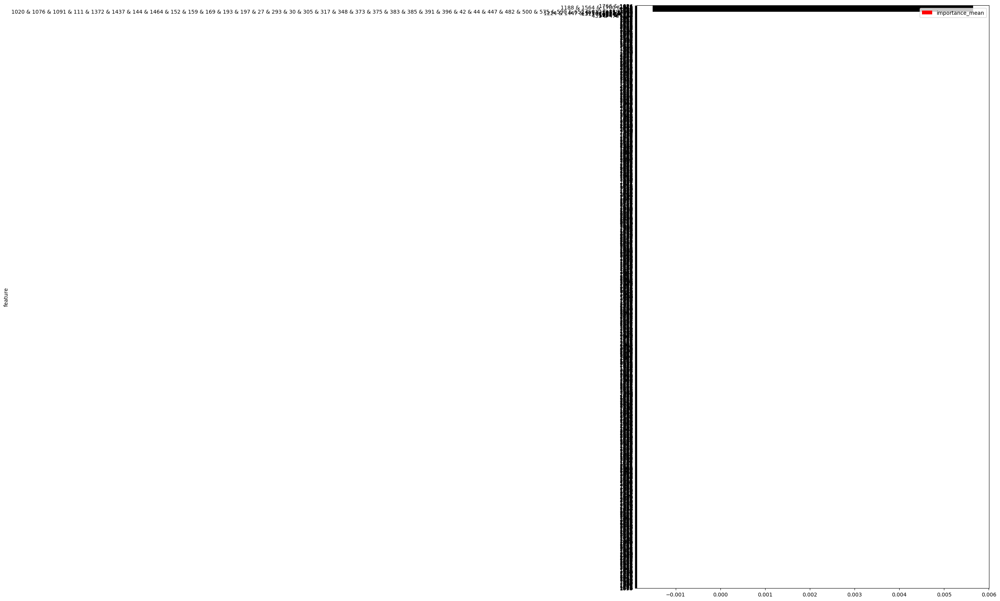

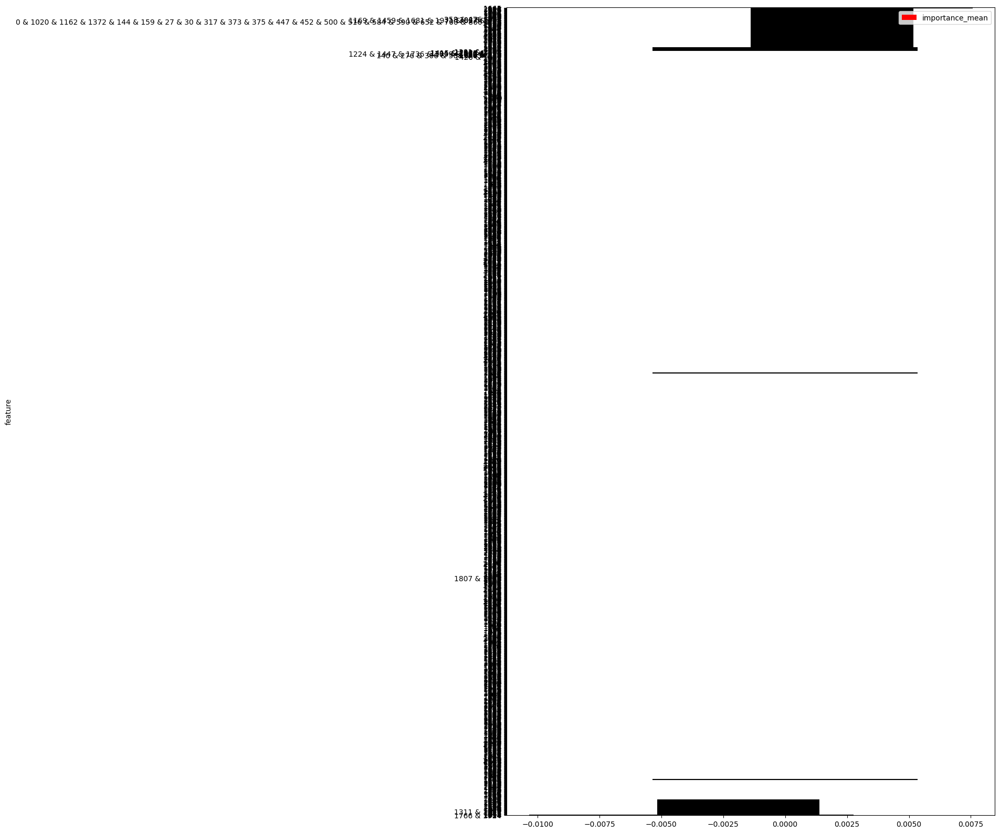

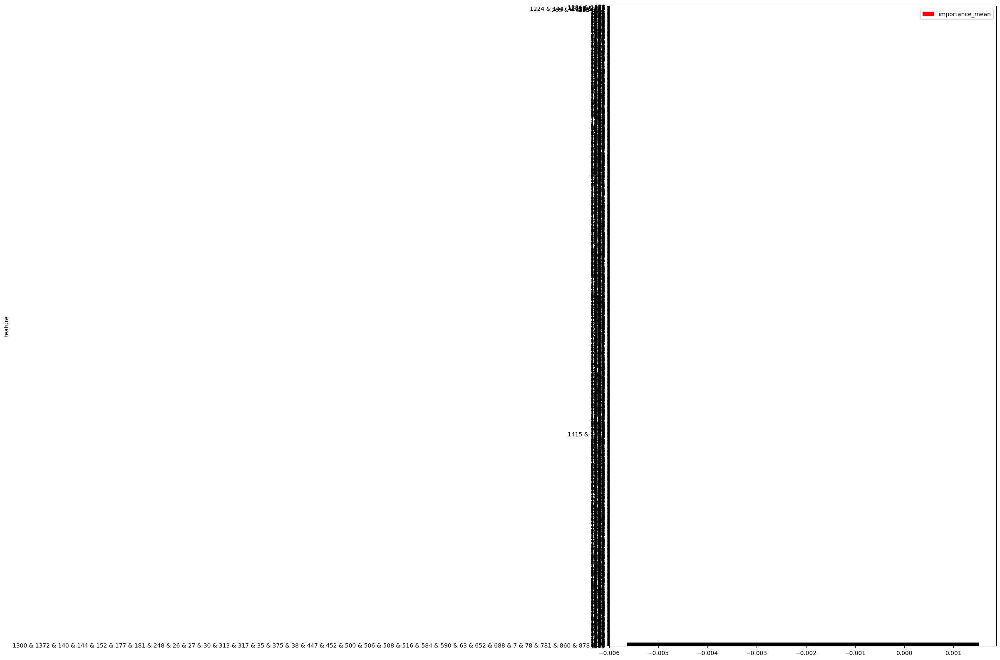

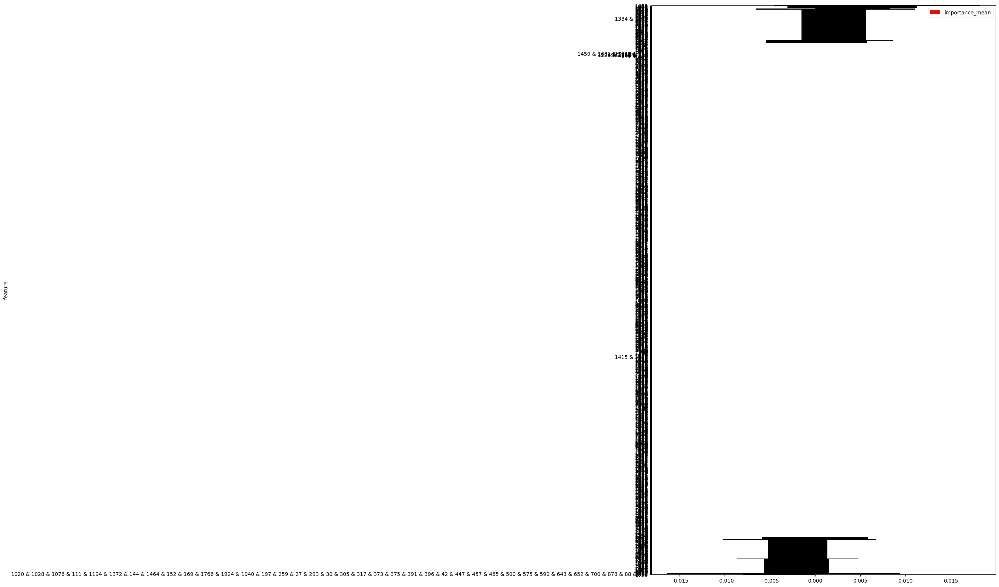

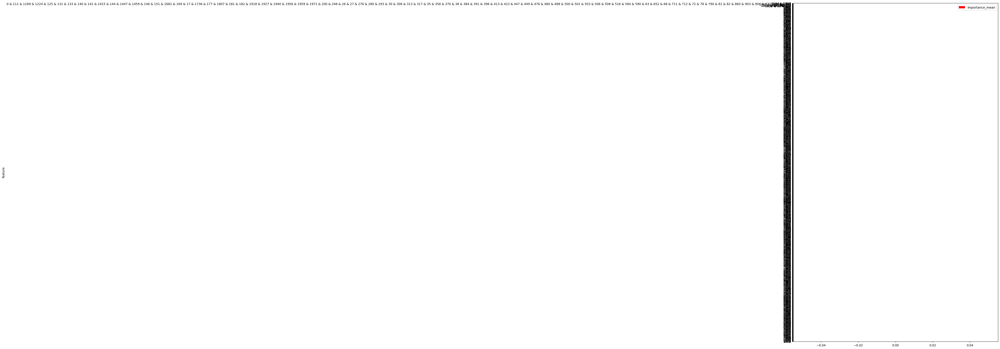

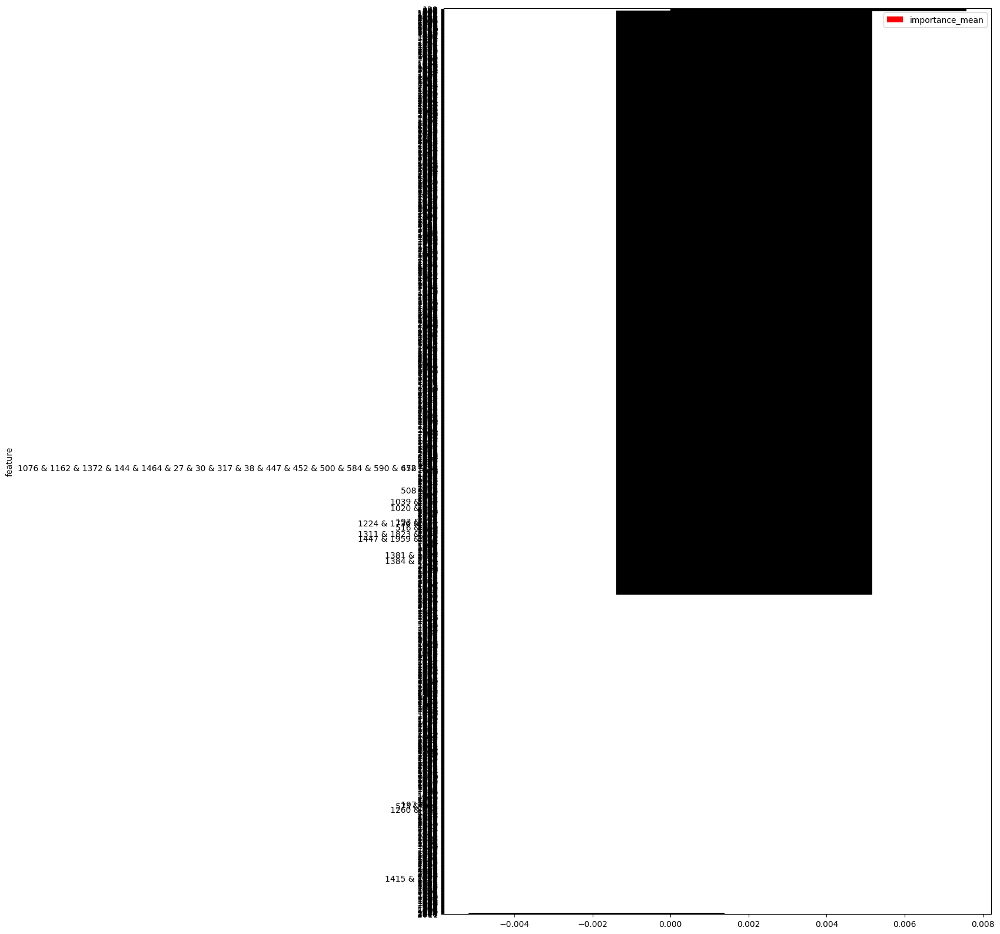

In [42]:
byols_feature_names = [i for i in range(2048)]
byols_str_feature_names = [str(i) for i in range(2048)]

byols_fi_dict = {}
lofo_dict_byols = {}

emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

for e in emotions:

  print(e)
  print('---------------------------------------------------------------------')
  print()

  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)

  trained_model, result = classification_pipeline(embeddings=byols_embeddings, speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
  Performance['Hybrid_Byols_2048'][e] = result

  fi = feature_importance_method(X=byols_embeddings, y=byols_labels, feature_names=byols_feature_names, trained_model=trained_model)
  byols_fi_dict[e] = [tup[0] for tup in fi]


  print(byols_embeddings.shape)
  print(byols_labels)
  print(byols_str_feature_names)

  lofo_df = lofo_plot(embeddings_array=byols_embeddings, labels=byols_labels, feature_names=byols_str_feature_names, frac=1.0, e=e)
  lofo_df.round(3)
  lofo_dict_byols[e] = lofo_df

  print(fi)
  print()
  print()

In [43]:
lofo_dict_byols[emotions[0]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
1990,1766 & 1924,0.002066,0.003579,0.0,0.0,0.008264,0.0
1976,1020 & 1076 & 1091 & 111 & 1372 & 1437 & 144 &...,0.002066,0.003579,0.0,0.0,0.008264,0.0
324,1943,0.002066,0.003579,0.0,0.0,0.008264,0.0
429,1142,0.002066,0.003579,0.0,0.0,0.008264,0.0
942,1715,0.002066,0.003579,0.0,0.0,0.008264,0.0
913,1623,0.002066,0.003579,0.0,0.0,0.008264,0.0
1088,1241,0.002066,0.003579,0.0,0.0,0.008264,0.0
1295,1590,0.002066,0.003579,0.0,0.0,0.008264,0.0
1210,900,0.002066,0.003579,0.0,0.0,0.008264,0.0
953,714,0.002066,0.003579,0.0,0.0,0.008264,0.0


In [44]:
lofo_dict_byols[emotions[1]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
1811,1665,0.003788,0.003788,0.007576,0.007576,0.0,0.0
90,1777,0.001894,0.003280,0.007576,0.000000,0.0,0.0
203,1058,0.001894,0.003280,0.007576,0.000000,0.0,0.0
208,193,0.001894,0.003280,0.007576,0.000000,0.0,0.0
211,1341,0.001894,0.003280,0.007576,0.000000,0.0,0.0
825,1540,0.001894,0.003280,0.007576,0.000000,0.0,0.0
822,803,0.001894,0.003280,0.007576,0.000000,0.0,0.0
1783,950,0.001894,0.003280,0.007576,0.000000,0.0,0.0
1211,2029,0.001894,0.003280,0.007576,0.000000,0.0,0.0
1771,1398,0.001894,0.003280,0.007576,0.000000,0.0,0.0


In [45]:
lofo_dict_byols[emotions[2]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
0,1773,0.0,0.0,0.0,0.0,0.0,0.0
1327,864,0.0,0.0,0.0,0.0,0.0,0.0
1340,501,0.0,0.0,0.0,0.0,0.0,0.0
1339,1352,0.0,0.0,0.0,0.0,0.0,0.0
1338,1782,0.0,0.0,0.0,0.0,0.0,0.0
1337,1531,0.0,0.0,0.0,0.0,0.0,0.0
1336,1747,0.0,0.0,0.0,0.0,0.0,0.0
1335,178,0.0,0.0,0.0,0.0,0.0,0.0
1334,173,0.0,0.0,0.0,0.0,0.0,0.0
1333,1499,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
lofo_dict_byols[emotions[3]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
1317,1490,0.008092,0.010126,0.0,0.007576,0.024793,0.000000
1297,939,0.008092,0.005851,0.0,0.007576,0.016529,0.008264
236,1360,0.006198,0.010736,0.0,0.000000,0.024793,0.000000
513,1096,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
955,55,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
1042,1205,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
1818,963,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
1819,1665,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
1962,1296,0.004132,0.007157,0.0,0.000000,0.016529,0.000000
1324,1499,0.004132,0.004132,0.0,0.000000,0.008264,0.008264


In [47]:
lofo_dict_byols[emotions[4]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
0,1773,0.0,0.0,0.0,0.0,0.0,0.0
1312,98,0.0,0.0,0.0,0.0,0.0,0.0
1310,631,0.0,0.0,0.0,0.0,0.0,0.0
1309,147,0.0,0.0,0.0,0.0,0.0,0.0
1308,1270,0.0,0.0,0.0,0.0,0.0,0.0
1307,256,0.0,0.0,0.0,0.0,0.0,0.0
1306,1279,0.0,0.0,0.0,0.0,0.0,0.0
1305,1914,0.0,0.0,0.0,0.0,0.0,0.0
1304,539,0.0,0.0,0.0,0.0,0.0,0.0
1303,374,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
lofo_dict_byols[emotions[5]].head(10)

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3
589,129,0.003788,0.003788,0.007576,0.007576,0.0,0.0
1688,46,0.003788,0.003788,0.007576,0.007576,0.0,0.0
1668,451,0.003788,0.003788,0.007576,0.007576,0.0,0.0
1452,913,0.003788,0.003788,0.007576,0.007576,0.0,0.0
918,202,0.003788,0.003788,0.007576,0.007576,0.0,0.0
1430,407,0.003788,0.003788,0.007576,0.007576,0.0,0.0
943,1863,0.001894,0.003280,0.000000,0.007576,0.0,0.0
962,239,0.001894,0.003280,0.000000,0.007576,0.0,0.0
961,1500,0.001894,0.003280,0.000000,0.007576,0.0,0.0
960,1478,0.001894,0.003280,0.000000,0.007576,0.0,0.0


# Percentile

In [51]:
num_byols_features = {e: 1 for e in emotions}

def plot_top_performance(e, importance_dict):
  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)
  top_scores = []
  bottom_scores = []
  rest_scores = []

  for n in range(10, 1024, 10):

    top_features = importance_dict[e][:n]
    best_model, top_f1 = classification_pipeline(embeddings=byols_embeddings[:, top_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    top_scores.append(top_f1)

    rest_features = importance_dict[e][n+1:]
    best_model, rest_f1 = classification_pipeline(embeddings=byols_embeddings[:, rest_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    rest_scores.append(rest_f1)

    bottom_features = importance_dict[e][2048-n-1:]
    best_model, bottom_f1 = classification_pipeline(embeddings=byols_embeddings[:, bottom_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    bottom_scores.append(bottom_f1)

  n_features = range(10, 1024, 10)
  fig, ax = plt.subplots()

  ax.plot(n_features, top_scores, label='Top embeddings')
  ax.plot(n_features, rest_scores, label='Rest embeddings')
  ax.plot(n_features, bottom_scores, label='Bottom embeddings')

  ax.set_xlabel('Amount of top embeddings')
  ax.set_ylabel('F1 score')
  ax.set_title(e)
  ax.legend()

  percentile = np.percentile(top_scores, 100)
  # ax.axhline(y=percentile, color='r')

  ax.set_ylim(0, 1)
  x_val = find_x_at_n_percentile(n_features, top_scores, 100)
  ax.scatter(x_val, percentile, marker='x', color='red')

  return x_val, percentile



[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]


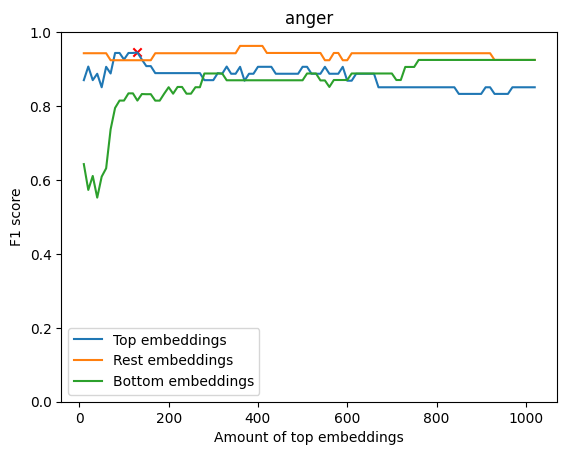

In [54]:
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

num_byols_features[emotions[0]], Performance['Hybrid_Byols_top_features'][emotions[0]] = plot_top_performance(emotions[0], byols_fi_dict)


[22  0 47  4 53 18 10 33 44 12 31  9 59  5 68 30 57 35 56 46 16 34 42 28
  7 61 40 50 45 19 55 39 25 38 13 49  3 17  8 54  6 36 63 67 15]
[ 49  16  20  96  68  17  55  15 112]
[30 56 38 12  3 14  7 45 40]
[65 52  1  9 22 10 50 59 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]


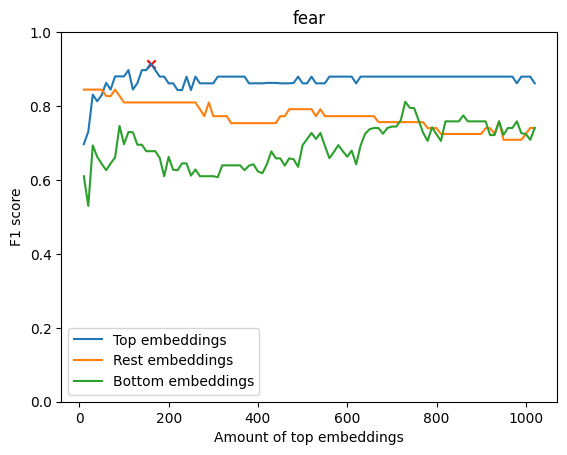

In [55]:

num_byols_features[emotions[1]], Performance['Hybrid_Byols_top_features'][emotions[1]]  = plot_top_performance(emotions[1], byols_fi_dict)


[30  0 22 31 18 28 10 70  4 12 49 33 67 35 68 45 73 61 55 40  9 64  5 47
 34 62 42 54 16 39 56 78  7 50 53 19 66 25 44 13 75  3 17 38  8]
[ 15   9  97  79  67  84 101  17  48]
[40 20 13 29  7 53 49  3 36]
[67 66  1  9 22 10 51 62 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]


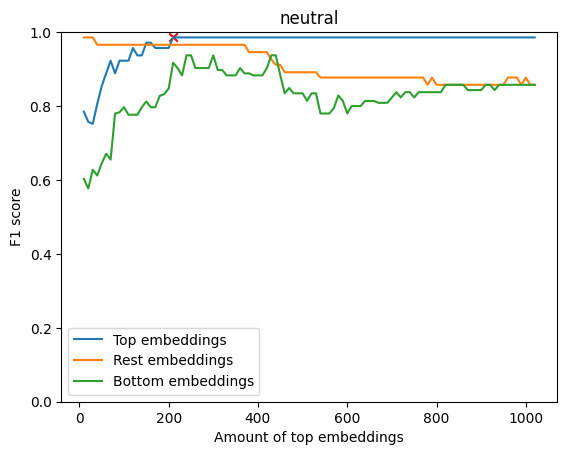

In [56]:

num_byols_features[emotions[2]], Performance['Hybrid_Byols_top_features'][emotions[2]] = plot_top_performance(emotions[2], byols_fi_dict)


[22  0 49  4 55 18 10 33 46 12 31  9 61  5 53 30 59 35 58 42 16 34 44 28
  7 54 50 45 47 19 57 40 25 39 13 70  3 17 38  8 56  6 36 65 63]
[ 49  16  20  96  68  17  55  15 112]
[13 42 29 24  9 34 14 45 41]
[44 33 29 58 69 70 25  9 54]
[ 4 42 27 14 57 59 33 13 35]
[28 39 40  2 26 10 34 19  6]


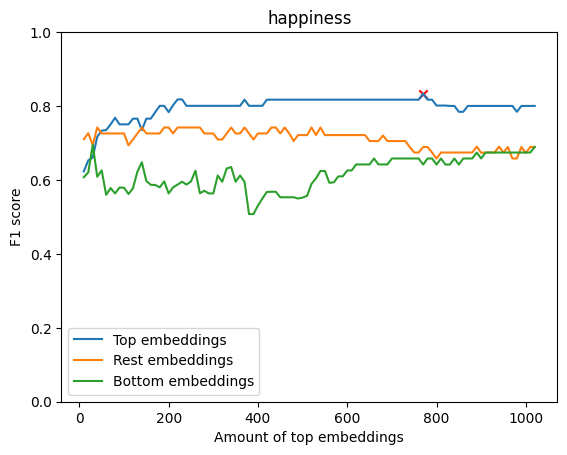

In [57]:

num_byols_features[emotions[3]], Performance['Hybrid_Byols_top_features'][emotions[3]] = plot_top_performance(emotions[3], byols_fi_dict)


[50 56  0 57  5 48 16 12 25 59 30  9 47 13 33 34  3 17 54  8  6 31  4 45
 19 52 36 53 41 58 15 40 27 26 24 44 11 32 55 43 37 29 46  1 21]
[ 69  51  20  82  75  15 121 110  30]
[33  6 28 58 13  7 20 12  9]
[14 66 52 71 60  9 53 27 12]
[51 13 12 19 11  4 61 55 62]
[ 8 30 18 37 17 29 16 45 26]


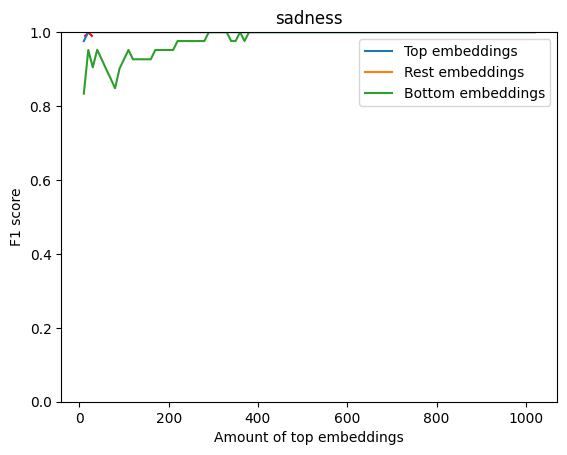

In [58]:

num_byols_features[emotions[4]], Performance['Hybrid_Byols_top_features'][emotions[4]] = plot_top_performance(emotions[4], byols_fi_dict)


[39 25 26 44 35 41  4 12  8  3  6 24 32 19 17 13 43 15  9 16 37 31 27  0
 30 29  5 11 33  1 40 21  2 34 23 36 10 22 18 45 20  7 42 14 28]
[106 109  50  55  94  29 101  51 100]
[ 9 52 15  6 53 58 34 13 45]
[12 20 27  9 77 16 37 55  5]
[51 13 12 19 11  4 61 55 62]
[34 30 37  2 35 10 46 49  6]


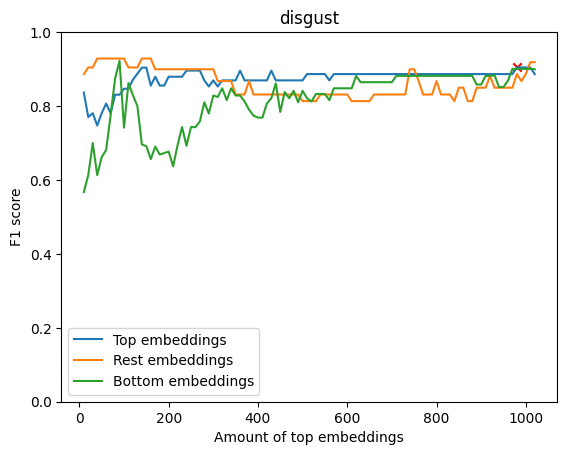

In [59]:

num_byols_features[emotions[5]], Performance['Hybrid_Byols_top_features'][emotions[5]] = plot_top_performance(emotions[5], byols_fi_dict)


In [60]:
print(num_byols_features)


{'anger': 130, 'fear': 160, 'neutral': 210, 'happiness': 770, 'sadness': 20, 'disgust': 980}


# LOFO Percentile

In [79]:
lofo_num_byols_features = {e: 1 for e in emotions}

def plot_top_performance_lofo(e):
  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)

  top_scores = []
  rest_scores = []

  feats_array = []
  x_vals = []
  x_val = 0

  for num in range(0, 1024, 10):

    for feature_set in lofo_dict_byols[e]['feature'][num:num+10]:
      new_feats = [int(f) for f in feature_set.split(' & ')]
      feats_array.extend(new_feats)

    x_val = len(feats_array)
    x_vals.append(x_val)

    print(feats_array)
    print(x_vals)

    top_features = feats_array
    best_model, top_f1 = classification_pipeline(embeddings=byols_embeddings[:, top_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    top_scores.append(top_f1)

    rest_features = [f for f in range(2048) if f not in feats_array]
    best_model, rest_f1 = classification_pipeline(embeddings=byols_embeddings[:, rest_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    rest_scores.append(rest_f1)

  n_features = x_vals
  fig, ax = plt.subplots()

  ax.plot(n_features, top_scores, label='Top embeddings')
  ax.plot(n_features, rest_scores, label='Rest embeddings')

  ax.set_xlabel('Amount of top embeddings')
  ax.set_ylabel('F1 score')
  ax.set_title(e)
  ax.legend()

  percentile = np.percentile(top_scores, 100)

  ax.set_ylim(0, 1)
  x_val = find_x_at_n_percentile(n_features, top_scores, 100)
  ax.scatter(x_val, percentile, marker='x', color='red')
  lofo_num_byols_features[e] = x_val

  return x_val, percentile



[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]
[1766, 1924, 1020, 1076, 1091, 111, 1372, 1437, 144, 1464, 152, 159, 169, 193, 197, 27, 293, 30, 305, 317, 348, 373, 375, 383, 385, 391, 396, 42, 44, 447, 482, 500, 575, 590, 652, 817, 878, 88, 1943, 1142, 1715, 1623, 1241, 1590, 900, 714]
[46]
[1766, 1924, 1020, 1076, 1091, 111, 1372, 1437, 144, 1464, 152, 159, 169, 193, 197, 27, 293, 30, 305, 317, 348, 373, 375, 383, 385, 391, 396, 42, 44, 447, 482, 500, 575, 590, 652, 817, 878, 88, 1943, 1142, 1715, 1623, 1241, 1590, 900, 714, 1673, 1654, 1955, 813, 564, 952, 702, 1188, 1564, 1700, 676, 1739, 1571]
[46, 59]
[1766, 1924, 1020, 1076, 1091, 111, 1372, 1437, 144, 1464, 152, 159, 169, 193, 197, 27, 293, 30, 305, 31

(109, 0.9806215290086258)

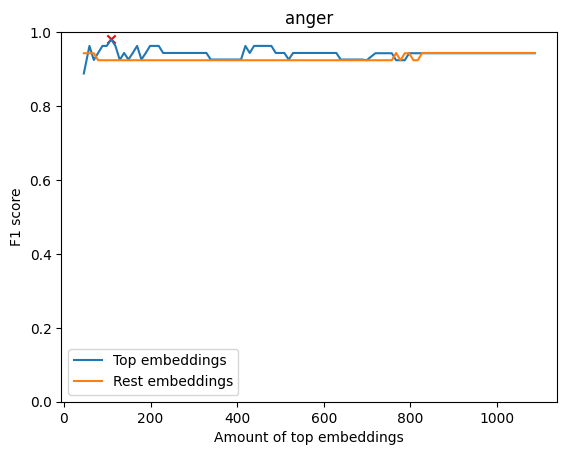

In [80]:
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

plot_top_performance_lofo(emotions[0])


[22  0 47  4 53 18 10 33 44 12 31  9 59  5 68 30 57 35 56 46 16 34 42 28
  7 61 40 50 45 19 55 39 25 38 13 49  3 17  8 54  6 36 63 67 15]
[ 49  16  20  96  68  17  55  15 112]
[30 56 38 12  3 14  7 45 40]
[65 52  1  9 22 10 50 59 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]
[1665, 1777, 1058, 193, 1341, 1540, 803, 950, 2029, 1398]
[10]
[1665, 1777, 1058, 193, 1341, 1540, 803, 950, 2029, 1398, 1360, 1427, 1874, 154, 1615, 642, 599, 1378, 675, 967]
[10, 20]
[1665, 1777, 1058, 193, 1341, 1540, 803, 950, 2029, 1398, 1360, 1427, 1874, 154, 1615, 642, 599, 1378, 675, 967, 1412, 960, 1942, 1299, 118, 1144, 247, 634, 1170, 1476]
[10, 20, 30]
[1665, 1777, 1058, 193, 1341, 1540, 803, 950, 2029, 1398, 1360, 1427, 1874, 154, 1615, 642, 599, 1378, 675, 967, 1412, 960, 1942, 1299, 118, 1144, 247, 634, 1170, 1476, 1962, 122, 22, 1368, 645, 665, 921, 650, 624, 1508]
[10, 20, 30, 40]
[1665, 1777, 1058, 193, 1341, 1540, 803, 950, 2029, 1398, 1360, 1427, 1874, 154, 1615, 642, 599, 1378, 

(218, 0.9659136623686607)

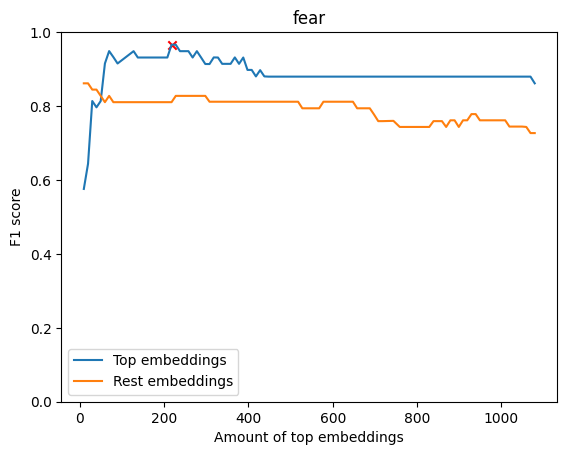

In [81]:

plot_top_performance_lofo(emotions[1])


[30  0 22 31 18 28 10 70  4 12 49 33 67 35 68 45 73 61 55 40  9 64  5 47
 34 62 42 54 16 39 56 78  7 50 53 19 66 25 44 13 75  3 17 38  8]
[ 15   9  97  79  67  84 101  17  48]
[40 20 13 29  7 53 49  3 36]
[67 66  1  9 22 10 51 62 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]
[1773, 864, 501, 1352, 1782, 1531, 1747, 178, 173, 1499]
[10]
[1773, 864, 501, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 1490, 44, 1487, 1374, 906]
[10, 20]
[1773, 864, 501, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 1490, 44, 1487, 1374, 906, 1233, 424, 1555, 1136, 263, 1857, 689, 520, 637, 1925]
[10, 20, 30]
[1773, 864, 501, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 1490, 44, 1487, 1374, 906, 1233, 424, 1555, 1136, 263, 1857, 689, 520, 637, 1925, 188, 1284, 1975, 374, 1001, 962, 1225, 393, 1756, 589]
[10, 20, 30, 40]
[1773, 864, 501, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 1490, 44, 1487, 1374, 906

(650, 0.9856908856908857)

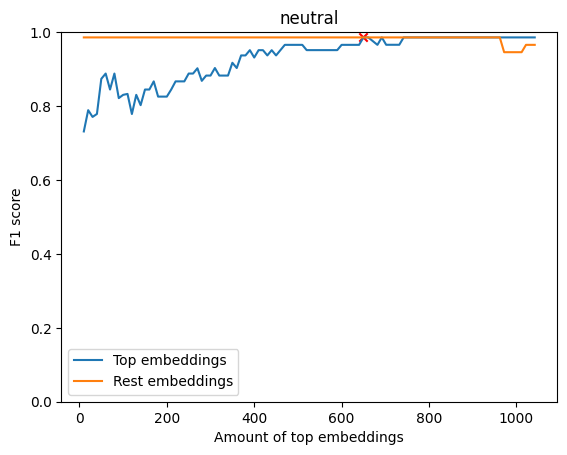

In [82]:

plot_top_performance_lofo(emotions[2])


[22  0 49  4 55 18 10 33 46 12 31  9 61  5 53 30 59 35 58 42 16 34 44 28
  7 54 50 45 47 19 57 40 25 39 13 70  3 17 38  8 56  6 36 65 63]
[ 49  16  20  96  68  17  55  15 112]
[13 42 29 24  9 34 14 45 41]
[44 33 29 58 69 70 25  9 54]
[ 4 42 27 14 57 59 33 13 35]
[28 39 40  2 26 10 34 19  6]
[1490, 939, 1360, 1096, 55, 1205, 963, 1665, 1296, 1499]
[10]
[1490, 939, 1360, 1096, 55, 1205, 963, 1665, 1296, 1499, 1973, 594, 1541, 1111, 1077, 925, 139, 1794, 891, 1280]
[10, 20]
[1490, 939, 1360, 1096, 55, 1205, 963, 1665, 1296, 1499, 1973, 594, 1541, 1111, 1077, 925, 139, 1794, 891, 1280, 1586, 512, 1361, 1847, 546, 1118, 1294, 1381, 1226, 1496]
[10, 20, 30]
[1490, 939, 1360, 1096, 55, 1205, 963, 1665, 1296, 1499, 1973, 594, 1541, 1111, 1077, 925, 139, 1794, 891, 1280, 1586, 512, 1361, 1847, 546, 1118, 1294, 1381, 1226, 1496, 1235, 534, 1989, 62, 145, 1689, 1694, 1109, 1597, 650]
[10, 20, 30, 40]
[1490, 939, 1360, 1096, 55, 1205, 963, 1665, 1296, 1499, 1973, 594, 1541, 1111, 1077, 925, 139, 1

(141, 0.9344551184818148)

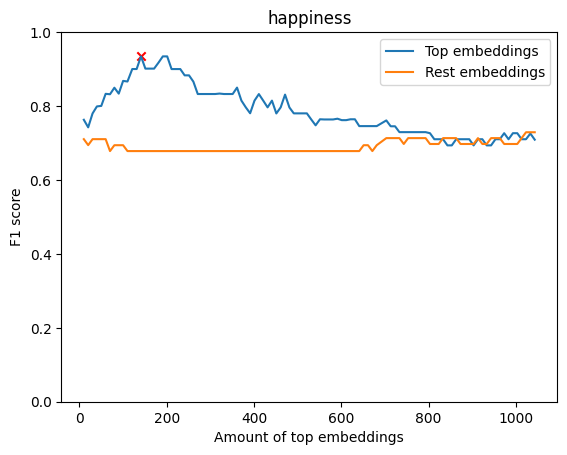

In [83]:

plot_top_performance_lofo(emotions[3])


[50 56  0 57  5 48 16 12 25 59 30  9 47 13 33 34  3 17 54  8  6 31  4 45
 19 52 36 53 41 58 15 40 27 26 24 44 11 32 55 43 37 29 46  1 21]
[ 69  51  20  82  75  15 121 110  30]
[33  6 28 58 13  7 20 12  9]
[14 66 52 71 60  9 53 27 12]
[51 13 12 19 11  4 61 55 62]
[ 8 30 18 37 17 29 16 45 26]
[1773, 98, 631, 147, 1270, 256, 1279, 1914, 539, 374]
[10]
[1773, 98, 631, 147, 1270, 256, 1279, 1914, 539, 374, 1975, 1284, 188, 1352, 1782, 1531, 1747, 178, 173, 1499]
[10, 20]
[1773, 98, 631, 147, 1270, 256, 1279, 1914, 539, 374, 1975, 1284, 188, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 864, 1490, 1487, 1374, 80]
[10, 20, 30]
[1773, 98, 631, 147, 1270, 256, 1279, 1914, 539, 374, 1975, 1284, 188, 1352, 1782, 1531, 1747, 178, 173, 1499, 715, 551, 846, 1302, 1775, 864, 1490, 1487, 1374, 80, 1701, 1406, 585, 1796, 1687, 1278, 964, 1671, 1213, 285]
[10, 20, 30, 40]
[1773, 98, 631, 147, 1270, 256, 1279, 1914, 539, 374, 1975, 1284, 188, 1352, 1782, 1531, 1747, 178, 173, 1499, 7

(30, 1.0)

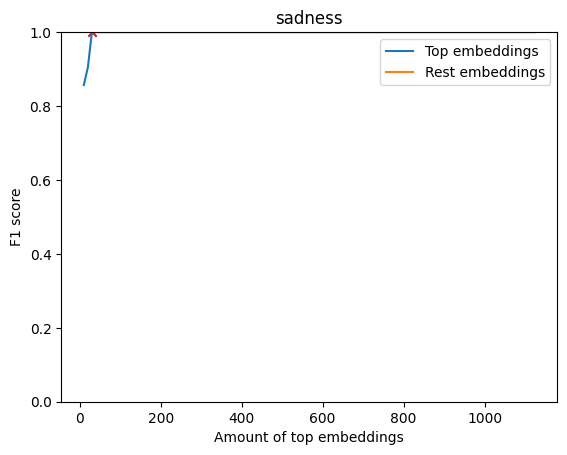

In [84]:

plot_top_performance_lofo(emotions[4])


[39 25 26 44 35 41  4 12  8  3  6 24 32 19 17 13 43 15  9 16 37 31 27  0
 30 29  5 11 33  1 40 21  2 34 23 36 10 22 18 45 20  7 42 14 28]
[106 109  50  55  94  29 101  51 100]
[ 9 52 15  6 53 58 34 13 45]
[12 20 27  9 77 16 37 55  5]
[51 13 12 19 11  4 61 55 62]
[34 30 37  2 35 10 46 49  6]
[129, 46, 451, 913, 202, 407, 1863, 239, 1500, 1478]
[10]
[129, 46, 451, 913, 202, 407, 1863, 239, 1500, 1478, 672, 1135, 669, 1715, 1741, 1191, 1481, 67, 26, 855]
[10, 20]
[129, 46, 451, 913, 202, 407, 1863, 239, 1500, 1478, 672, 1135, 669, 1715, 1741, 1191, 1481, 67, 26, 855, 1987, 1285, 933, 1073, 1773, 618, 1015, 1958, 1529, 1105]
[10, 20, 30]
[129, 46, 451, 913, 202, 407, 1863, 239, 1500, 1478, 672, 1135, 669, 1715, 1741, 1191, 1481, 67, 26, 855, 1987, 1285, 933, 1073, 1773, 618, 1015, 1958, 1529, 1105, 1219, 299, 503, 647, 1443, 109, 55, 309, 1408, 677]
[10, 20, 30, 40]
[129, 46, 451, 913, 202, 407, 1863, 239, 1500, 1478, 672, 1135, 669, 1715, 1741, 1191, 1481, 67, 26, 855, 1987, 1285, 933, 10

(740, 0.9295869442210906)

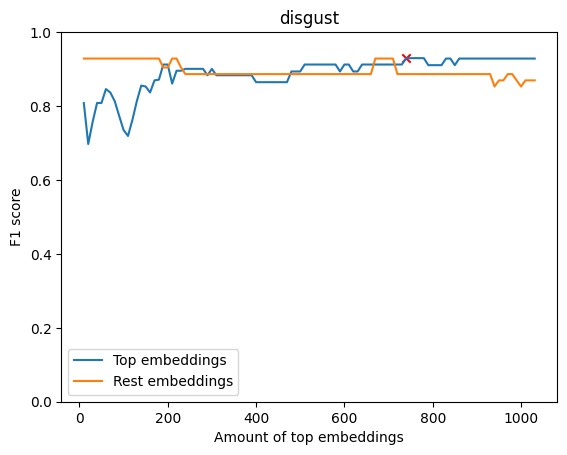

In [85]:

plot_top_performance_lofo(emotions[5])


In [86]:
print(lofo_num_byols_features)


{'anger': 1, 'fear': 1, 'neutral': 1, 'happiness': 1, 'sadness': 1, 'disgust': 1}


# Predicting Functions

In [87]:


# Defining a function for all steps
def prediction_pipeline(labeled_array, labels_list, regression_model, scoring='neg_mean_squared_error'):

  # Train Test Splitting
  X_train, X_test, y_train, y_test = train_test_split(
      labeled_array, labels_list, test_size=0.30)

  # Getting hyperparameters

  if regression_model == 'linreg':
    classifier = LinearRegression(fit_intercept=True)
    parameters = {} # update
    result = get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring=scoring)

  elif regression_model == 'elasticnet':
    regressor = ElasticNet()
    parameters = {'model__alpha': [0, 0.5, 1], 'model__l1_ratio': np.arange(0,1.1,0.1)}
    result, p = get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring=scoring)

  return result, p


In [88]:

# Defining a function for hyperparameter tuning and getting the accuracy on the test set
def get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring='neg_mean_squared_error'):
  '''
  Splits into training and testing set with different speakers

  Parameters
  ------------
  X_train: torch tensor
    The normalised embeddings that will be used for training
  X_test: torch tensor
    The normalised embeddings that will be used for testing
  y_train: list
    The labels that will be used for training
  y_test: list
    The labels that will be used for testing
  classifier: object
    The instance of the classification model
  parameters: dictionary
    The dictionary of parameters for GridSearchCV

  Returns
  ------------
    The dictionary of the best hyperparameters

  '''

  # Define the pipeline
  pipe = Pipeline([
          ('scaler', StandardScaler()),
          ('model', regressor)
      ])

  grid = GridSearchCV(pipe, param_grid=parameters, cv=5, n_jobs=-1, scoring=scoring)
  grid.fit(X_train, y_train)

  y_pred = grid.predict(X_test)
  r_squared = r2_score(y_test, y_pred)
  pearson_correlation = np.corrcoef(y_test, y_pred)[0, 1]

  return r_squared, pearson_correlation

In [89]:


# def color_bar_plot(y, sort=True):
#   x = egemaps_feature_names
#   y = y

#   sns.set(rc={'figure.figsize':(20,8)})
#   if sort==True:
#     sorted_idx = sorted(range(len(x)), key=lambda k: y[k])
#     x = [x[i] for i in sorted_idx]
#     y = [y[i] for i in sorted_idx]
#     ax = sns.set(rc={'figure.figsize':(20,8)})
#   bar_color = "gray"
#   ax = sns.barplot(x=x, y=y, color=bar_color)
#   tick_labels = plt.xticks()[1]
#   for i in range(len(tick_labels)):
#     tick_label = tick_labels[i].get_text()
#     plt.xticks(rotation=90, ha='center')
#     plt.setp(tick_labels[i], color=egemaps_category_dict[tick_label])

#   data = {'egemaps feature names': x, 'R2': y}
#   df = pd.DataFrame(data)
#   df = df.iloc[::-1]
#   return df

# Getting performance for top features

In [90]:
predicted_df_dict = {}

def top_byols_predict_ege(e):

  en_errors_r_squared_top = []
  en_errors_r_squared_all = []
  pearson_corr_top = []
  pearson_corr_all = []

  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)
  ege_embeddings, ege_labels, ege_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=egemaps_embeddings_dict, speakers_dict=egemaps_speakers_list_dict, num=45)

  top_features = byols_fi_dict[e][:num_byols_features[e]]
  all_features = byols_fi_dict[e][:]


  for i in tqdm(range(88)):

    en_r_squared_top, p_corr_top = prediction_pipeline(byols_embeddings[:, top_features], ege_embeddings[:,i], regression_model='elasticnet')
    en_errors_r_squared_top.append(np.round(en_r_squared_top, 3))
    pearson_corr_top.append(np.round(p_corr_top, 3))

    en_r_squared_all, p_corr_all = prediction_pipeline(byols_embeddings[:, all_features], ege_embeddings[:,i], regression_model='elasticnet')
    en_errors_r_squared_all.append(np.round(en_r_squared_all, 3))
    pearson_corr_all.append(np.round(p_corr_all, 3))

  prediction_metrics_dict = {'features':egemaps_feature_names, 'pearson top':pearson_corr_top, 'R2 top':en_errors_r_squared_top, 'pearson all': pearson_corr_all, 'R2 all':en_errors_r_squared_all}

  return prediction_metrics_dict


In [91]:
df = pd.DataFrame(top_byols_predict_ege(emotions[0]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[0]] = sorted_df


[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]
[ 26 111  81  55  44  96  80 125 114  62  45   4  18  95  36  94  19 120
  10  40  11  98 104  77   0  78  68  69  12  42  31  27  24  93 110  91
  15  76  22  47  64 105  30  83  66]
[23 39 53  7 56 15 33 65 17]
[13 42 29 24  9 34 14 45 41]
[64  9 57 60 25 63 38 14  4]
[51 13 12 19 11  4 60 54 61]
[ 8 30 18 37 17 29 16 45 26]


100%|██████████| 88/88 [14:16<00:00,  9.73s/it]


In [92]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
60,hammarbergIndexV_sma3nz_amean,0.590,0.330,0.936,0.864
35,HNRdBACF_sma3nz_stddevNorm,0.559,0.307,0.755,0.493
62,slopeV0-500_sma3nz_amean,0.572,0.306,0.926,0.854
87,equivalentSoundLevel_dBp,0.515,0.244,0.673,0.447
58,alphaRatioV_sma3nz_amean,0.641,0.239,0.956,0.913
67,spectralFluxV_sma3nz_stddevNorm,0.582,0.237,0.850,0.666
21,spectralFlux_sma3_stddevNorm,0.522,0.229,0.795,0.521
78,slopeUV0-500_sma3nz_amean,0.541,0.227,0.948,0.878
38,logRelF0-H1-A3_sma3nz_amean,0.614,0.227,0.938,0.867
50,F2amplitudeLogRelF0_sma3nz_amean,0.460,0.205,0.913,0.829


In [110]:
df = pd.DataFrame(top_byols_predict_ege(emotions[1]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[1]] = sorted_df


  0%|          | 0/88 [00:00<?, ?it/s]

[22  0 47  4 53 18 10 33 44 12 31  9 59  5 68 30 57 35 56 46 16 34 42 28
  7 61 40 50 45 19 55 39 25 38 13 49  3 17  8 54  6 36 63 67 15]
[ 49  16  20  96  68  17  55  15 112]
[30 56 38 12  3 14  7 45 40]
[65 52  1  9 22 10 50 59 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]
[22  0 47  4 53 18 10 33 44 12 31  9 59  5 68 30 57 35 56 46 16 34 42 28
  7 61 40 50 45 19 55 39 25 38 13 49  3 17  8 54  6 36 63 67 15]
[ 49  16  20  96  68  17  55  15 112]
[30 56 38 12  3 14  7 45 40]
[65 52  1  9 22 10 50 59 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]


100%|██████████| 88/88 [13:50<00:00,  9.44s/it]


In [111]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.610,0.324,0.977,0.932
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.515,0.235,0.966,0.908
68,mfcc1V_sma3nz_amean,0.463,0.147,0.960,0.876
56,F3amplitudeLogRelF0_sma3nz_amean,0.405,0.132,0.920,0.798
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.375,0.114,0.970,0.925
34,HNRdBACF_sma3nz_amean,0.347,0.107,0.948,0.863
82,VoicedSegmentsPerSec,0.405,0.101,0.415,0.080
85,MeanUnvoicedSegmentLength,0.487,0.089,0.642,0.403
6,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,0.321,0.078,0.168,-0.761
76,alphaRatioUV_sma3nz_amean,0.367,0.071,0.834,0.527


In [ ]:
df = pd.DataFrame(top_byols_predict_ege(emotions[2]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[2]] = sorted_df


  0%|          | 0/88 [00:00<?, ?it/s]

[30  0 22 31 18 28 10 70  4 12 49 33 67 35 68 45 73 61 55 40  9 64  5 47
 34 62 42 54 16 39 56 78  7 50 53 19 66 25 44 13 75  3 17 38  8]
[ 15   9  97  79  67  84 101  17  48]
[40 20 13 29  7 53 49  3 36]
[67 66  1  9 22 10 51 62 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]
[30  0 22 31 18 28 10 70  4 12 49 33 67 35 68 45 73 61 55 40  9 64  5 47
 34 62 42 54 16 39 56 78  7 50 53 19 66 25 44 13 75  3 17 38  8]
[ 15   9  97  79  67  84 101  17  48]
[40 20 13 29  7 53 49  3 36]
[67 66  1  9 22 10 51 62 14]
[40 50 58 17 36 51 60 29 47]
[ 3 33 26 21 19 17 35 13 10]


 80%|███████▉  | 70/88 [11:14<02:10,  7.26s/it]

In [113]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
22,mfcc1_sma3_amean,0.688,0.401,0.939,0.797
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.697,0.397,0.990,0.964
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.745,0.363,0.973,0.942
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.639,0.351,0.973,0.922
40,F1frequency_sma3nz_amean,0.591,0.313,0.826,0.676
11,loudness_sma3_stddevNorm,0.544,0.252,0.883,0.721
46,F2frequency_sma3nz_amean,0.471,0.221,0.878,0.736
38,logRelF0-H1-A3_sma3nz_amean,0.585,0.212,0.898,0.791
36,logRelF0-H1-H2_sma3nz_amean,0.482,0.205,0.854,0.621
61,hammarbergIndexV_sma3nz_stddevNorm,0.490,0.202,0.641,0.396


In [114]:
df = pd.DataFrame(top_byols_predict_ege(emotions[3]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[3]] = sorted_df


  0%|          | 0/88 [00:00<?, ?it/s]

[22  0 49  4 55 18 10 33 46 12 31  9 61  5 53 30 59 35 58 42 16 34 44 28
  7 54 50 45 47 19 57 40 25 39 13 70  3 17 38  8 56  6 36 65 63]
[ 49  16  20  96  68  17  55  15 112]
[13 42 29 24  9 34 14 45 41]
[44 33 29 58 69 70 25  9 54]
[ 4 42 27 14 57 59 33 13 35]
[28 39 40  2 26 10 34 19  6]
[22  0 49  4 55 18 10 33 46 12 31  9 61  5 53 30 59 35 58 42 16 34 44 28
  7 54 50 45 47 19 57 40 25 39 13 70  3 17 38  8 56  6 36 65 63]
[ 49  16  20  96  68  17  55  15 112]
[13 42 29 24  9 34 14 45 41]
[44 33 29 58 69 70 25  9 54]
[ 4 42 27 14 57 59 33 13 35]
[28 39 40  2 26 10 34 19  6]


100%|██████████| 88/88 [13:27<00:00,  9.18s/it]


In [115]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
55,F3bandwidth_sma3nz_stddevNorm,0.093,0.004,NaN,-0.027
64,slopeV500-1500_sma3nz_amean,NaN,-0.000,0.950,0.844
10,loudness_sma3_amean,NaN,-0.000,0.793,0.558
75,mfcc4V_sma3nz_stddevNorm,NaN,-0.000,-0.002,-3.755
28,mfcc4_sma3_amean,NaN,-0.000,0.920,0.814
85,MeanUnvoicedSegmentLength,NaN,-0.001,0.855,0.728
20,spectralFlux_sma3_amean,NaN,-0.001,0.663,0.411
56,F3amplitudeLogRelF0_sma3nz_amean,0.109,-0.001,0.949,0.866
26,mfcc3_sma3_amean,NaN,-0.001,0.887,0.758
13,loudness_sma3_percentile50.0,NaN,-0.001,0.764,0.414


In [116]:
df = pd.DataFrame(top_byols_predict_ege(emotions[4]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[4]] = sorted_df


  0%|          | 0/88 [00:00<?, ?it/s]

[50 56  0 57  5 48 16 12 25 59 30  9 47 13 33 34  3 17 54  8  6 31  4 45
 19 52 36 53 41 58 15 40 27 26 24 44 11 32 55 43 37 29 46  1 21]
[ 69  51  20  82  75  15 121 110  30]
[33  6 28 58 13  7 20 12  9]
[14 66 52 71 60  9 53 27 12]
[51 13 12 19 11  4 61 55 62]
[ 8 30 18 37 17 29 16 45 26]
[50 56  0 57  5 48 16 12 25 59 30  9 47 13 33 34  3 17 54  8  6 31  4 45
 19 52 36 53 41 58 15 40 27 26 24 44 11 32 55 43 37 29 46  1 21]
[ 69  51  20  82  75  15 121 110  30]
[33  6 28 58 13  7 20 12  9]
[14 66 52 71 60  9 53 27 12]
[51 13 12 19 11  4 61 55 62]
[ 8 30 18 37 17 29 16 45 26]


100%|██████████| 88/88 [13:13<00:00,  9.02s/it]


In [ ]:
sorted_df.head(10)

In [ ]:
df = pd.DataFrame(top_byols_predict_ege(emotions[5]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[5]] = sorted_df


In [ ]:
sorted_df.head(10)

In [ ]:
def summary_table(e, df1):

  df2 = predicted_df_dict[e]

  stats_dict = {'number of features':[], 'pearson top':[], 'R2 top':[], 'pearson all':[], 'R2 all':[]}
  df = df1.copy(deep=True)
  df.index = range(len(df))

  for i in range(10):

    all_features = df1.iloc[i, 0].split(' & ')
    # print(all_features)

    r_squared_values_top = []
    r_squared_values_all = []
    pearson_correlations_top = []
    pearson_correlations_all = []

    for f in all_features:
      # print(f)
      matching_row = df2[df2['features'] == f]
      r_squared_values_top.append( matching_row['R2 top'])
      r_squared_values_all.append( matching_row['R2 all'])
      pearson_correlations_top.append( matching_row['pearson top'])
      pearson_correlations_all.append( matching_row['pearson all'])

    stats_dict['number of features'].append(len(r_squared_values_top))

    if len(r_squared_values_top)>1:
      stats_dict['R2 top'].append(f"{np.round(np.mean(r_squared_values_top), 3)} [{np.min(r_squared_values_top)} - {np.max(r_squared_values_top)}]")
      stats_dict['R2 all'].append(str(np.round(np.mean(r_squared_values_all), 3)) +' ['+str(np.min(r_squared_values_all))+' - '+str(np.max(r_squared_values_all))+']')
      stats_dict['pearson top'].append(str(np.round(np.mean(pearson_correlations_top), 3)) +' ['+str(np.min(pearson_correlations_top))+' - '+str(np.max(pearson_correlations_top))+']')
      stats_dict['pearson all'].append(str(np.round(np.mean(pearson_correlations_all), 3)) +' ['+str(np.min(pearson_correlations_all))+' - '+str(np.max(pearson_correlations_all))+']')
    else:
      stats_dict['R2 top'].append(str(np.mean(r_squared_values_top)))
      stats_dict['R2 all'].append(str(np.mean(r_squared_values_all)))
      stats_dict['pearson top'].append(str(np.mean(pearson_correlations_top)))
      stats_dict['pearson all'].append(str(np.mean(pearson_correlations_all)))

  stats_df = pd.DataFrame(stats_dict)
  summary_df = pd.concat([df, stats_df], axis=1)
  summary_df.round(3)

  return summary_df


In [ ]:
e = emotions[0]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
e = emotions[1]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
e = emotions[2]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
e = emotions[3]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
e = emotions[4]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
e = emotions[5]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[0]]})
df = summary_table(e=e, df1=df1.head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[1]]})
df = summary_table(e=e, df1=df1.head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[2]]})
df = summary_table(e=e, df1=df1.head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[3]]})
df = summary_table(e=e, df1=df1.head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[4]]})
df = summary_table(e=e, df1=df1.head(10))
df

In [ ]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[5]]})
df = summary_table(e=e, df1=df1.head(10))
df

# Performance summary

In [ ]:
df = pd.DataFrame(Performance)
df

# Extra Functions

### OpenSMILE feature categories

In [ ]:
# Color code ticklabels

vocal_folds = 'dodgerblue'
intensity = 'limegreen'
vocal_tract = 'crimson'
spectral = 'darkviolet'
prosodic = 'slategrey'

egemaps_category_dict = {
    'F0semitoneFrom27.5Hz_sma3nz_amean': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': vocal_folds,
        'loudness_sma3_amean': intensity,
       'loudness_sma3_stddevNorm': intensity,
        'loudness_sma3_percentile20.0': intensity,
       'loudness_sma3_percentile50.0': intensity,
        'loudness_sma3_percentile80.0': intensity,
       'loudness_sma3_pctlrange0-2': intensity,
        'loudness_sma3_meanRisingSlope': intensity,
       'loudness_sma3_stddevRisingSlope': intensity,
        'loudness_sma3_meanFallingSlope': intensity,
       'loudness_sma3_stddevFallingSlope': intensity,
        'spectralFlux_sma3_amean': spectral,
       'spectralFlux_sma3_stddevNorm':spectral,
        'mfcc1_sma3_amean': spectral,
       'mfcc1_sma3_stddevNorm': spectral,
    'mfcc2_sma3_amean': spectral,
    'mfcc2_sma3_stddevNorm': spectral,
       'mfcc3_sma3_amean': spectral,
    'mfcc3_sma3_stddevNorm': spectral,
    'mfcc4_sma3_amean': spectral,
       'mfcc4_sma3_stddevNorm': spectral,
    'jitterLocal_sma3nz_amean': vocal_folds,
       'jitterLocal_sma3nz_stddevNorm': vocal_folds,
    'shimmerLocaldB_sma3nz_amean': vocal_folds,
       'shimmerLocaldB_sma3nz_stddevNorm': vocal_folds,
        'HNRdBACF_sma3nz_amean': intensity,
       'HNRdBACF_sma3nz_stddevNorm': intensity,
        'logRelF0-H1-H2_sma3nz_amean': spectral,
       'logRelF0-H1-H2_sma3nz_stddevNorm': spectral,
        'logRelF0-H1-A3_sma3nz_amean': spectral,
       'logRelF0-H1-A3_sma3nz_stddevNorm': spectral,
      'F1frequency_sma3nz_amean': vocal_tract,
       'F1frequency_sma3nz_stddevNorm': vocal_tract,
        'F1bandwidth_sma3nz_amean': vocal_tract,
       'F1bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F1amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F1amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'F2frequency_sma3nz_amean': vocal_tract,
       'F2frequency_sma3nz_stddevNorm': vocal_tract,
        'F2bandwidth_sma3nz_amean': vocal_tract,
       'F2bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F2amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F2amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'F3frequency_sma3nz_amean': vocal_tract,
       'F3frequency_sma3nz_stddevNorm': vocal_tract,
        'F3bandwidth_sma3nz_amean': vocal_tract,
       'F3bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F3amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F3amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'alphaRatioV_sma3nz_amean': spectral,
       'alphaRatioV_sma3nz_stddevNorm': spectral,
        'hammarbergIndexV_sma3nz_amean': spectral,
       'hammarbergIndexV_sma3nz_stddevNorm': spectral,
        'slopeV0-500_sma3nz_amean': spectral,
       'slopeV0-500_sma3nz_stddevNorm': spectral,
        'slopeV500-1500_sma3nz_amean': spectral,
       'slopeV500-1500_sma3nz_stddevNorm': spectral,
        'spectralFluxV_sma3nz_amean': spectral,
       'spectralFluxV_sma3nz_stddevNorm': spectral,
        'mfcc1V_sma3nz_amean': spectral,
       'mfcc1V_sma3nz_stddevNorm': spectral,
        'mfcc2V_sma3nz_amean': spectral,
       'mfcc2V_sma3nz_stddevNorm': spectral,
        'mfcc3V_sma3nz_amean': spectral,
       'mfcc3V_sma3nz_stddevNorm': spectral,
        'mfcc4V_sma3nz_amean': spectral,
       'mfcc4V_sma3nz_stddevNorm': spectral,
        'alphaRatioUV_sma3nz_amean': spectral,
       'hammarbergIndexUV_sma3nz_amean': spectral,
        'slopeUV0-500_sma3nz_amean': spectral,
       'slopeUV500-1500_sma3nz_amean': spectral,
        'spectralFluxUV_sma3nz_amean': spectral,
       'loudnessPeaksPerSec': prosodic,
        'VoicedSegmentsPerSec': prosodic,
       'MeanVoicedSegmentLengthSec': prosodic,
        'StddevVoicedSegmentLengthSec': prosodic,
       'MeanUnvoicedSegmentLength': prosodic,
        'StddevUnvoicedSegmentLength': prosodic,
       'equivalentSoundLevel_dBp': intensity,
}


### Speaker normalisation functions

In [ ]:
# Defining a function for speaker normalisation using standard scaler

def speaker_normalisation(embeddings_array, speakers):
  '''
  Normalises embeddings_array for each speaker

  Parameters
  ------------
  embeddings_array: array
      The array of embeddings, one row for each audio file
  speakers: list
      The list of speakers

  Returns
  ------------
  embeddings_array: array
      The array containg normalised embeddings of all audio_files, dimension (number of audio files x n_feats)

  '''
  speaker_ids = set(speakers)
  for speaker_id in speaker_ids:
    speaker_embeddings_indices = np.where(np.array(speakers)==speaker_id)[0]
    speaker_embeddings = embeddings_array[speaker_embeddings_indices,:]
    scaler = StandardScaler()
    normalised_speaker_embeddings = scaler.fit_transform(speaker_embeddings)
    embeddings_array[speaker_embeddings_indices] = torch.tensor(normalised_speaker_embeddings).float()
  return embeddings_array


In [ ]:
# # Defining a function for speaker normalisation using standard scaler

# def emotion_normalisation(embeddings_array, labels):
#   '''
#   Normalises embeddings_array for each speaker

#   Parameters
#   ------------
#   embeddings_array: array
#       The array of embeddings, one row for each audio file
#   speakers: list
#       The list of speakers

#   Returns
#   ------------
#   embeddings_array: array
#       The array containg normalised embeddings of all audio_files, dimension (number of audio files × n_feats)

#   '''
#   label_ids = set(labels)
#   for label_id in label_ids:
#     label_indices = [i for i in range(len(labels)) if labels[i]==label_id]
#     label_embeddings = embeddings_array[label_indices,:]
#     scaler = StandardScaler()
#     normalised_emotion_embeddings = scaler.fit_transform(label_embeddings)
#     embeddings_array[label_indices] = torch.tensor(normalised_emotion_embeddings).float()
#   return embeddings_array

### Speaker normalisation on EmoDB

In [ ]:
# # # Normalised arrays
# normalised_embeddings_hybrid_byols = speaker_normalisation(embeddings_array_byols, speakers)
# normalised_embeddings_egemaps = speaker_normalisation(embeddings_array_egemaps, speakers)

# # Normalised arrays
# # normalised_embeddings_hybrid_byols = emotion_normalisation(embeddings_array_byols, labels)
# # normalised_embeddings_egemaps = emotion_normalisation(embeddings_array_egemaps, labels)

# # Verifying normalised_embeddings_arrays
# normalised_embeddings_arrays = {'hybrid_byols':normalised_embeddings_hybrid_byols, 'egemaps': normalised_embeddings_egemaps}

# for model in models:

#   print('MODEL: {}'.format(model))
#   print()
#   print('The shape of the normalised embeddings array is: {}'.format(normalised_embeddings_arrays[model].shape))
#   print('Normalised Embeddings Array:')
#   print((normalised_embeddings_arrays[model]))


# Descriptive Statistics

In [ ]:
required_labels = ['anger', 'fear', 'boredom', 'neutral', 'happiness', 'sadness', 'disgust']

anger_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='anger')[0],:]
bored_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='fear')[0],:]
disgust_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='boredom')[0],:]
fear_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='neutral')[0],:]
happy_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='happiness')[0],:]
sad_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='sadness')[0],:]
neutral_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='disgust')[0],:]


In [ ]:
color_to_feature_category_dict = {'dodgerblue': 'vocal_folds', 'crimson': 'vocal_tract', 'limegreen': 'intensity', 'darkviolet': 'spectral', 'slategrey': 'prosodic'}

def descriptive_box_plot(feature_number):
  feature_name = egemaps_feature_names[feature_number]
  data = [anger_embeddings[:,feature_number], bored_embeddings[:, feature_number], disgust_embeddings[:, feature_number], fear_embeddings[:, feature_number], happy_embeddings[:, feature_number], sad_embeddings[:, feature_number], neutral_embeddings[:, feature_number]]
  fig, ax = plt.subplots(figsize=(10,4))
  ax.set_title(feature_name+ ' '+color_to_feature_category_dict[egemaps_category_dict[feature_name]])
  ax.boxplot(data)
  ax.set_xticklabels(['anger', 'fear', 'boredom', 'neutral', 'happiness', 'sadness', 'disgust'])


### Plots

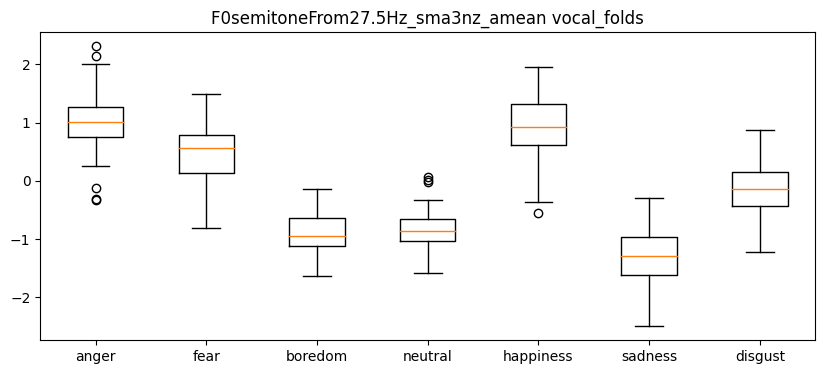

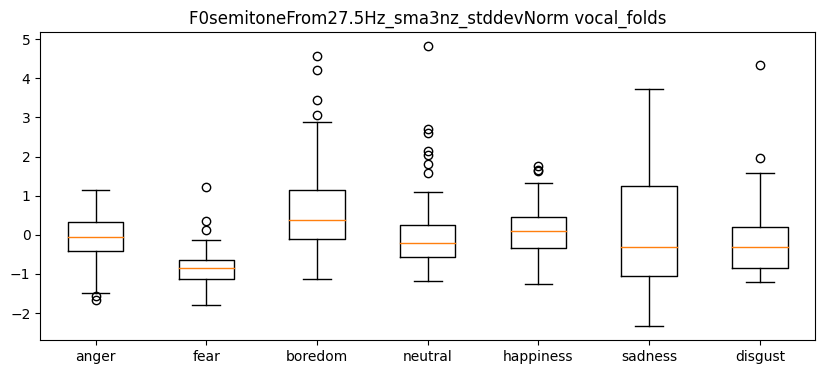

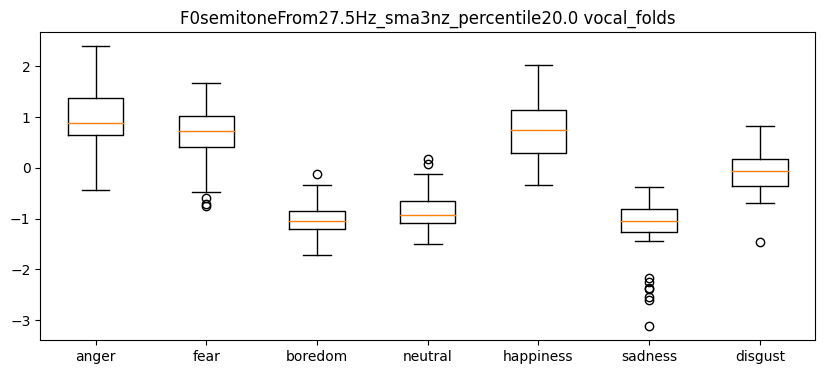

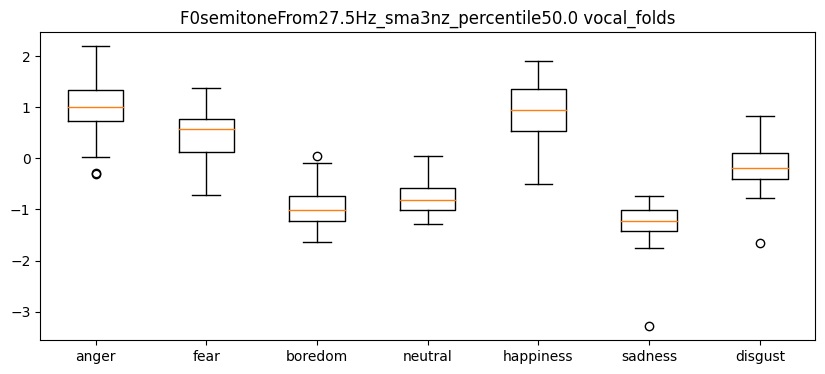

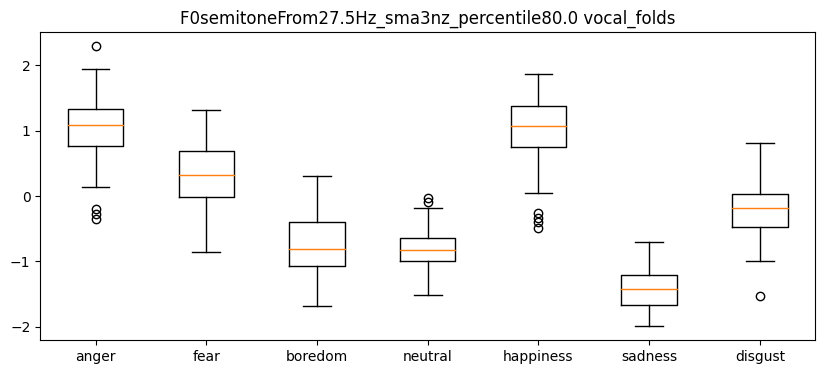

...

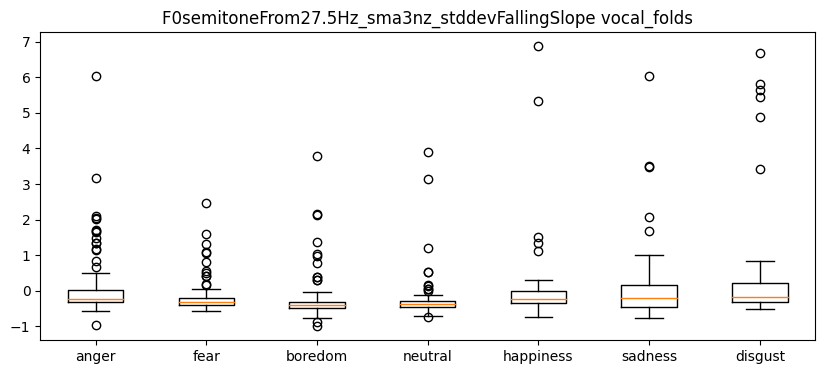

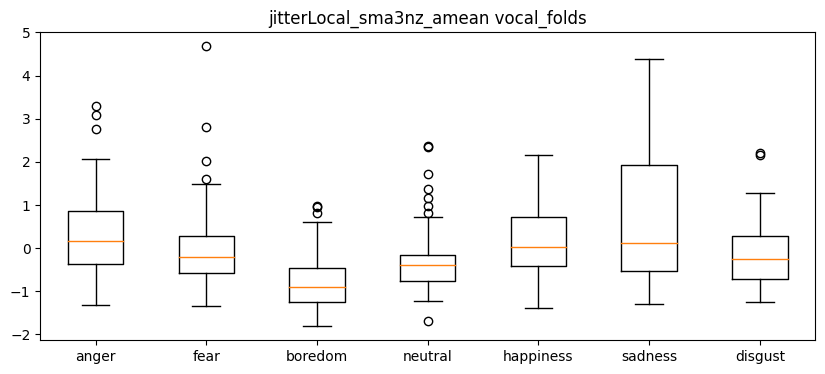

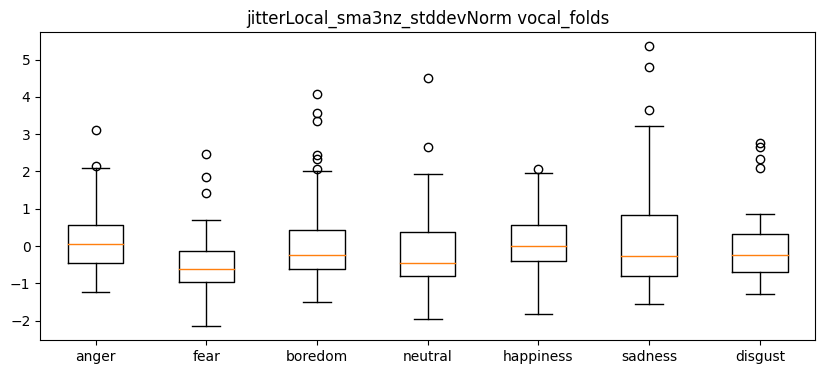

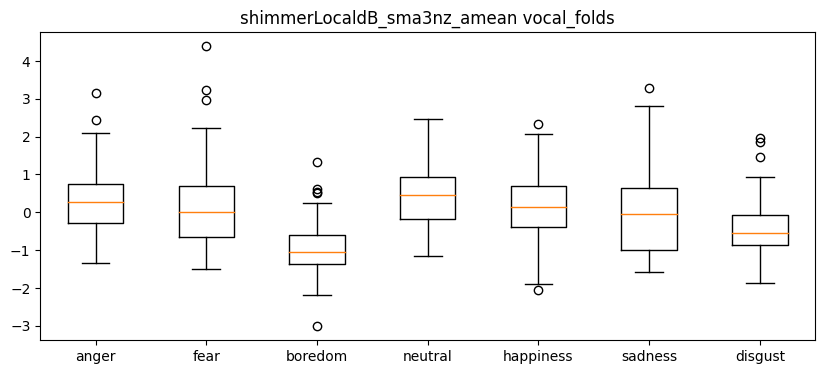

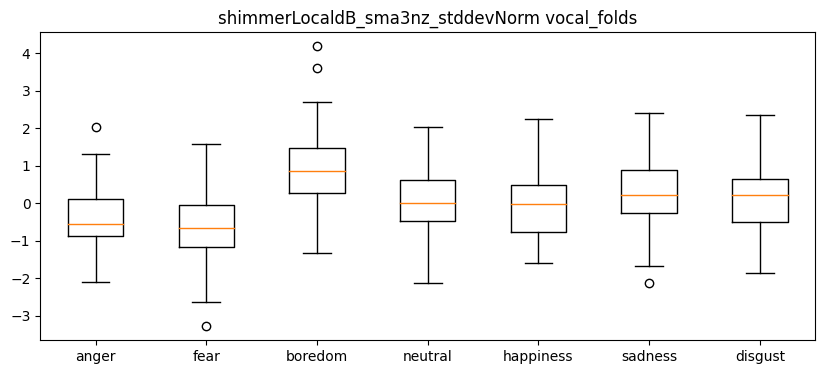

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='dodgerblue':
    descriptive_box_plot(i)

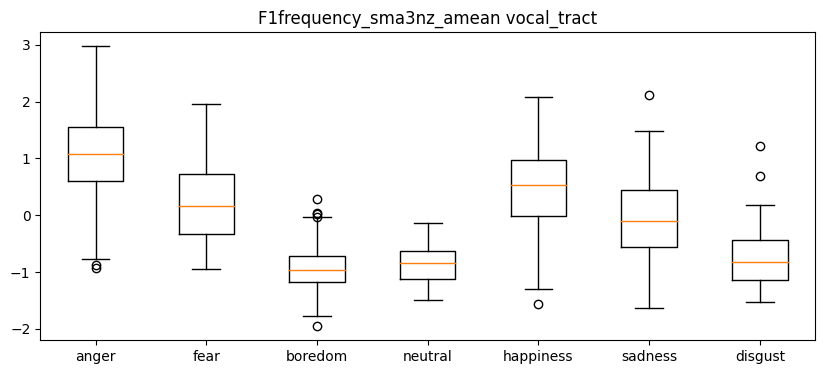

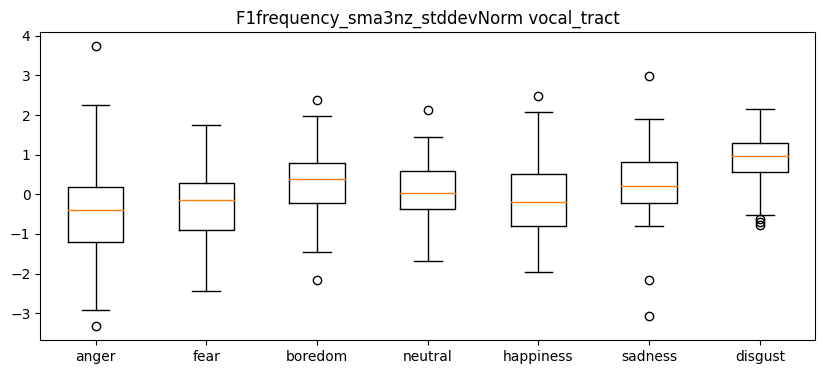

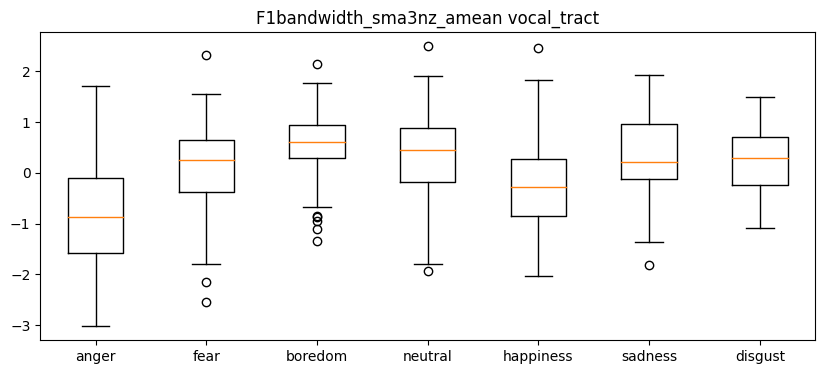

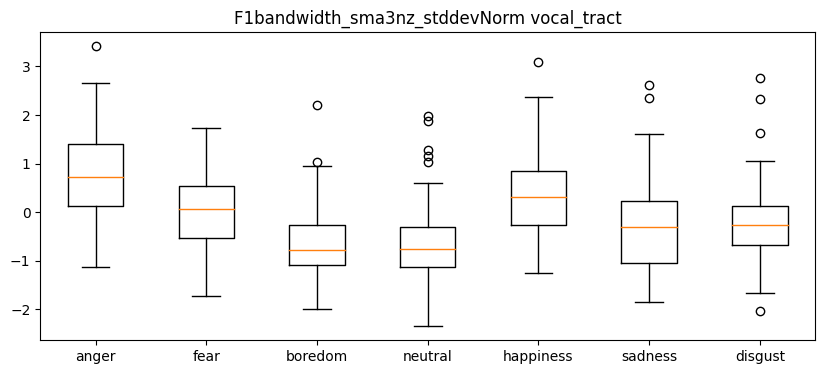

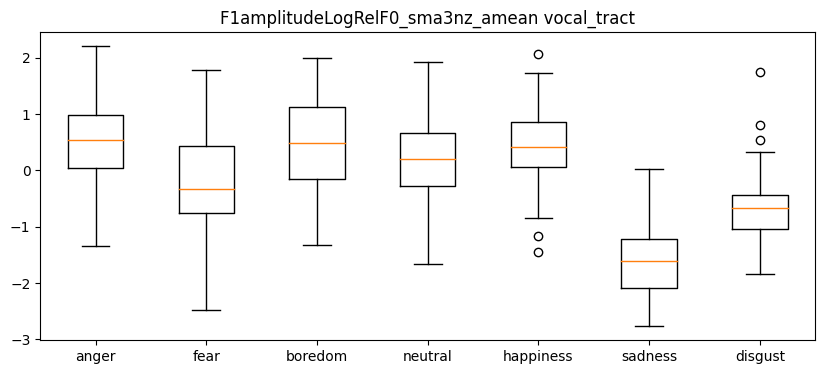

...

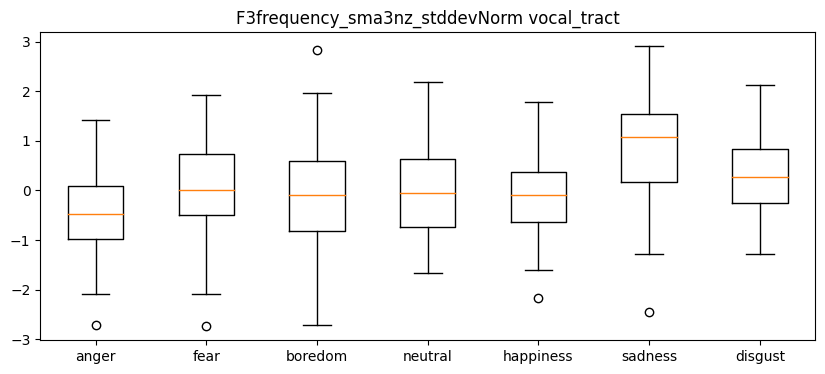

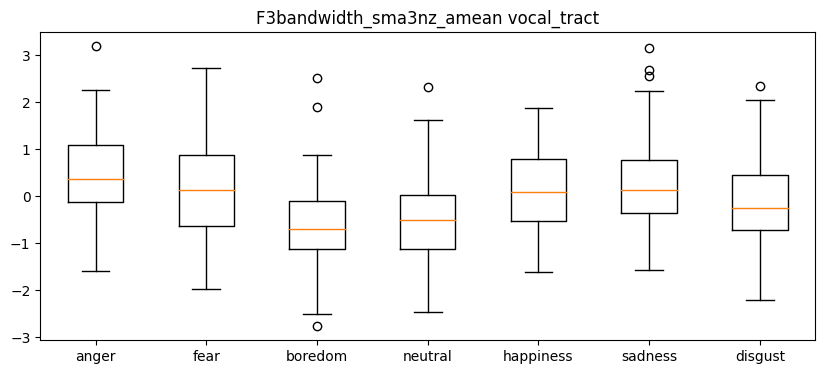

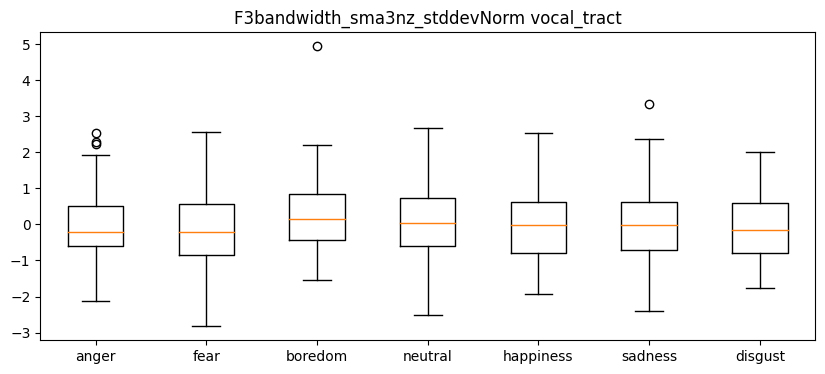

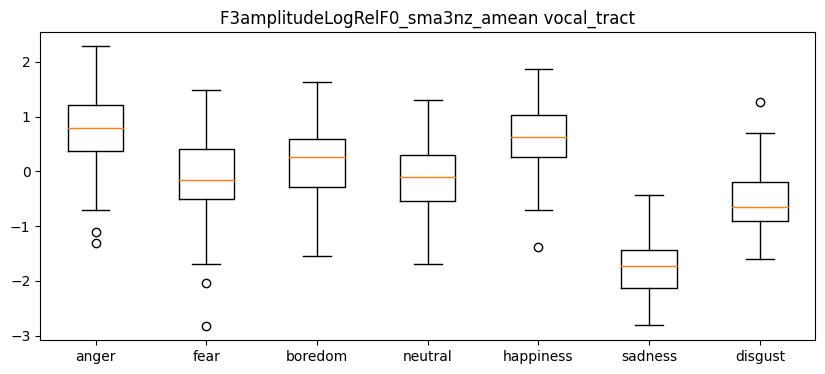

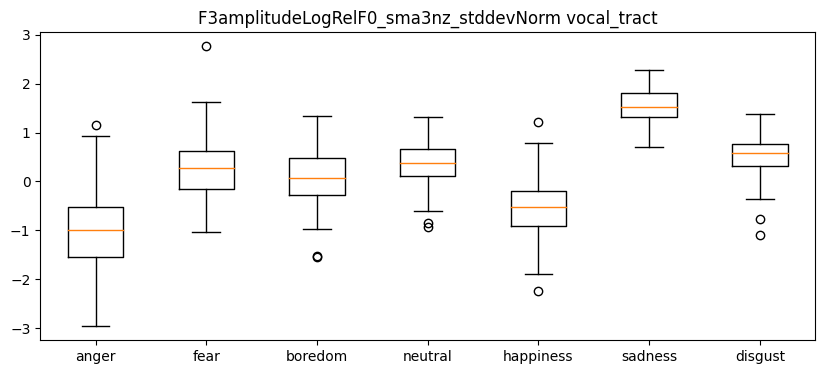

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='crimson':
    descriptive_box_plot(i)

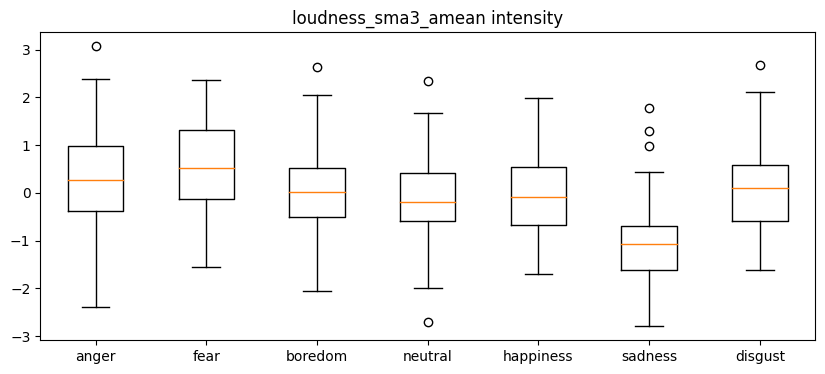

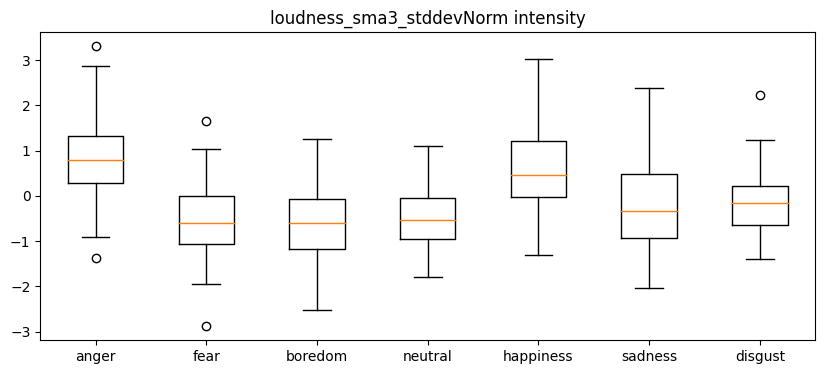

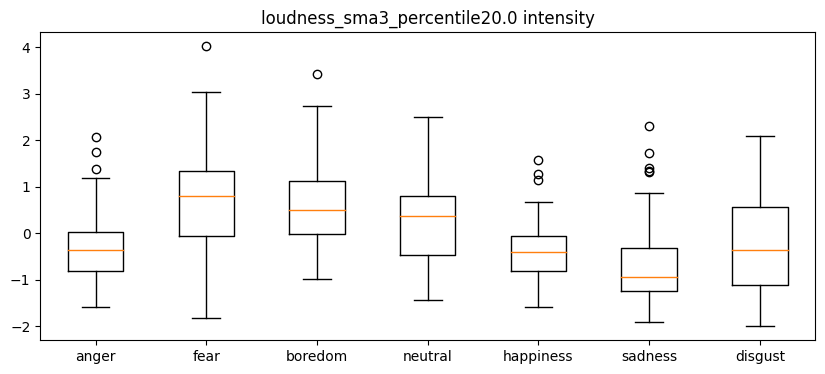

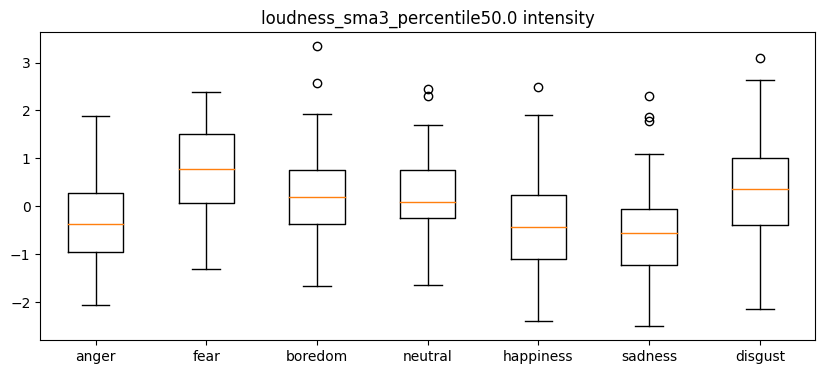

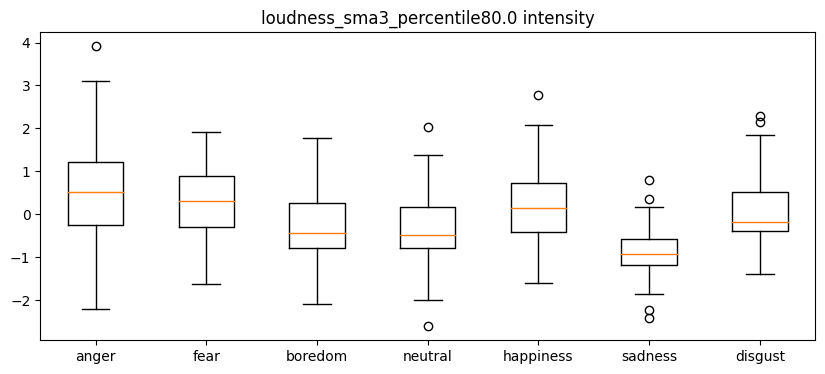

...

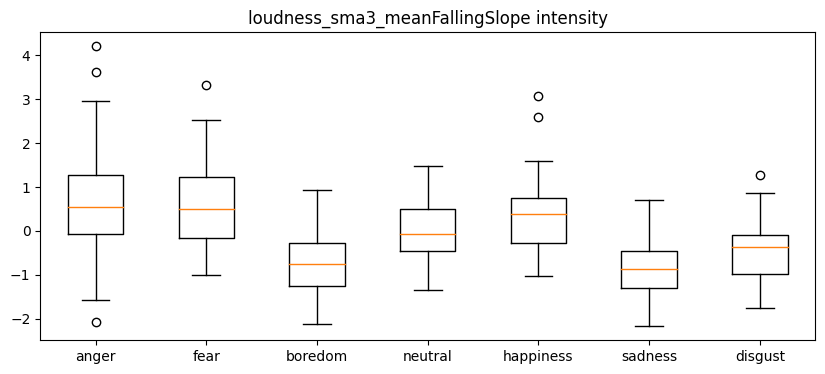

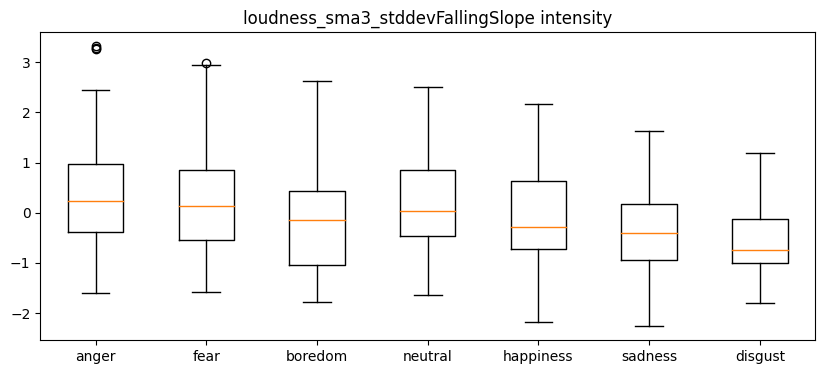

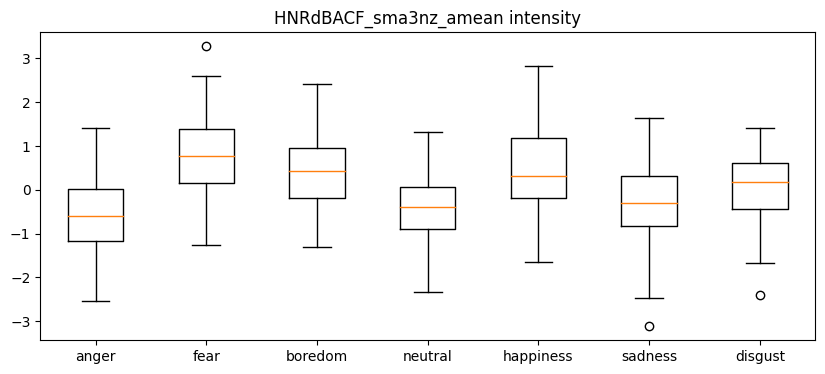

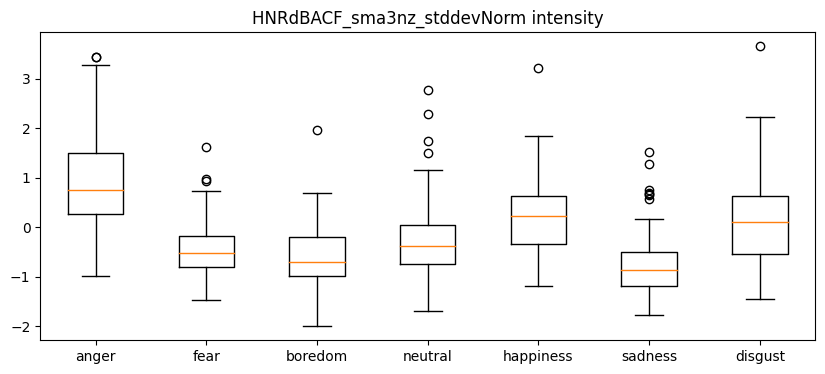

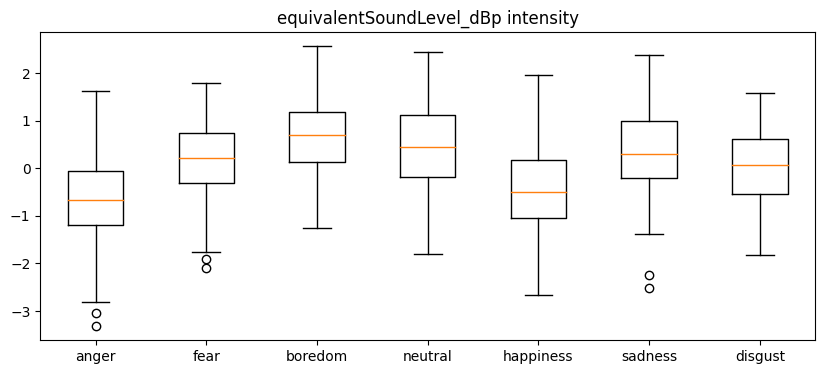

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='limegreen':
    descriptive_box_plot(i)

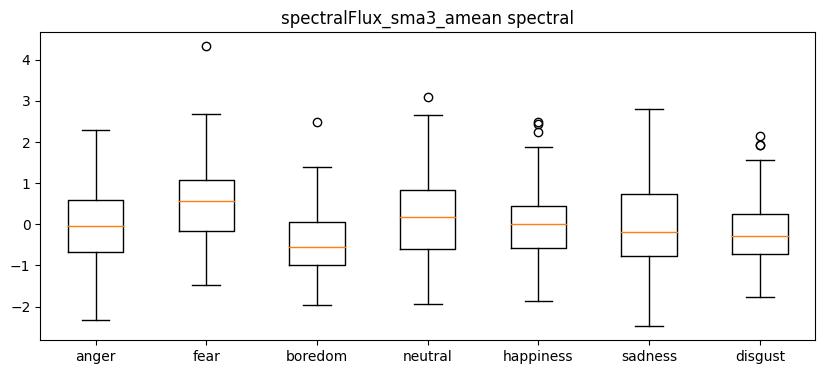

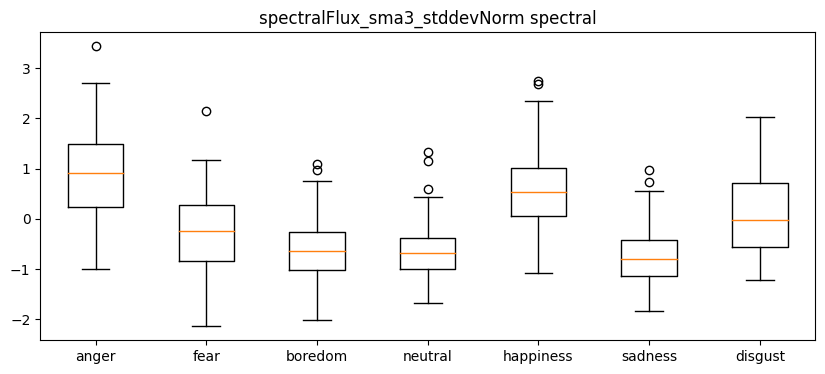

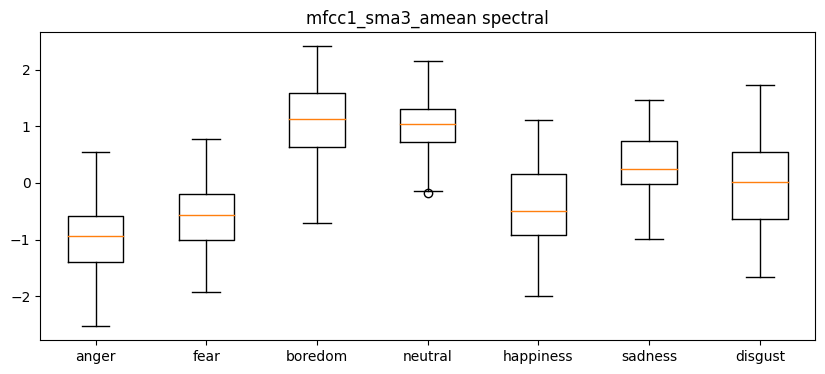

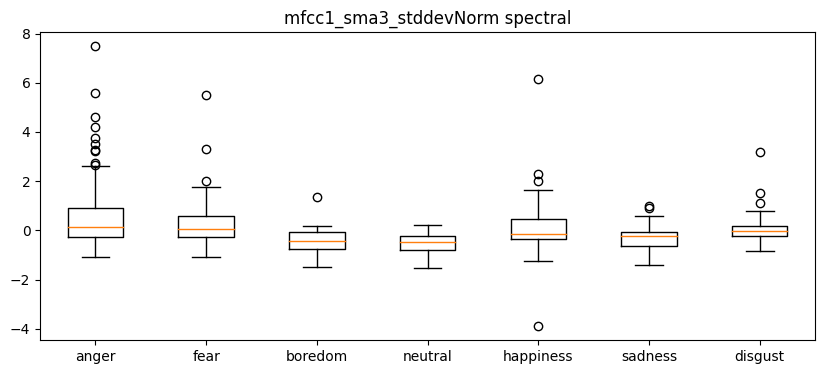

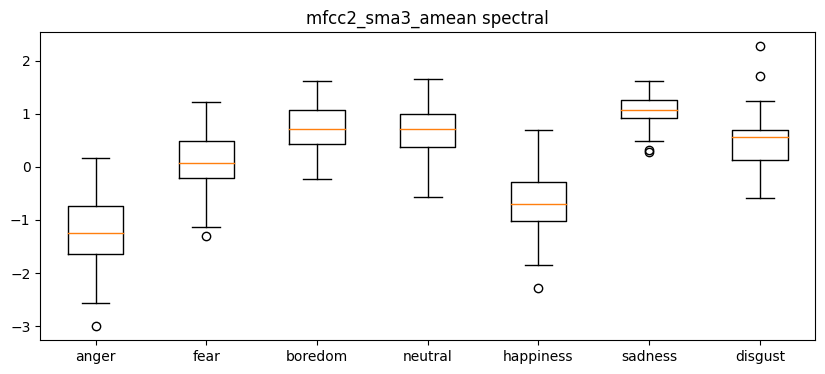

...

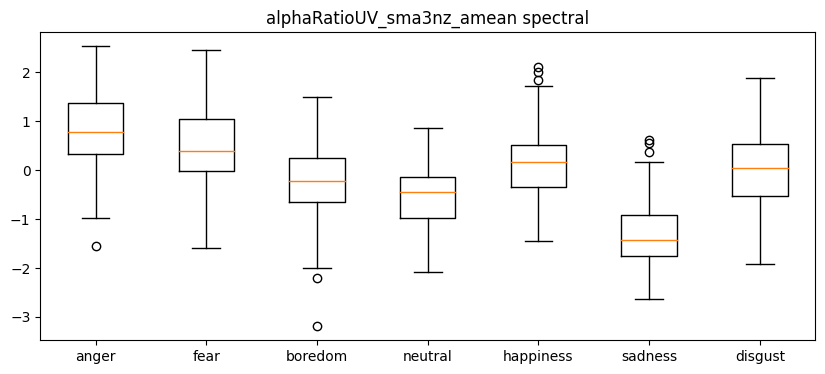

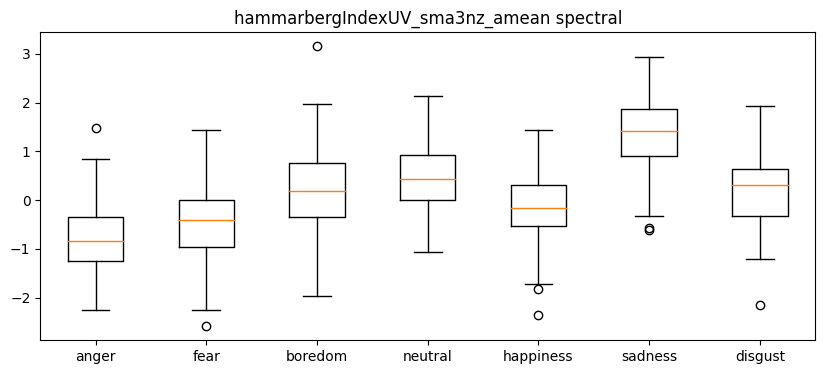

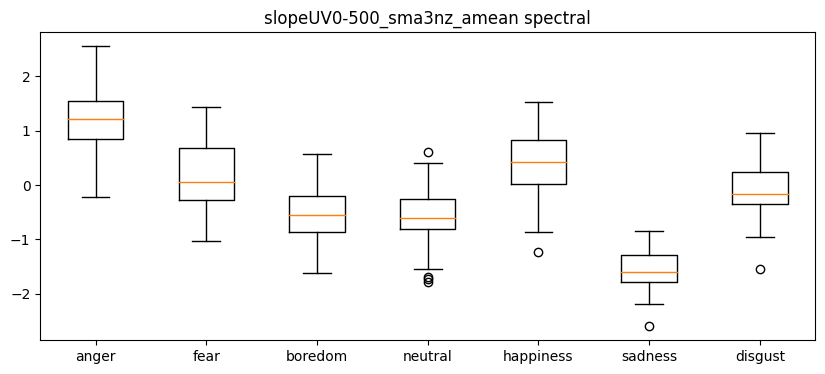

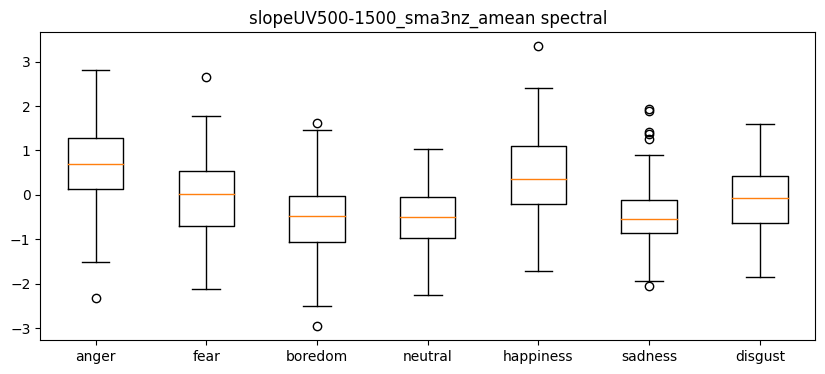

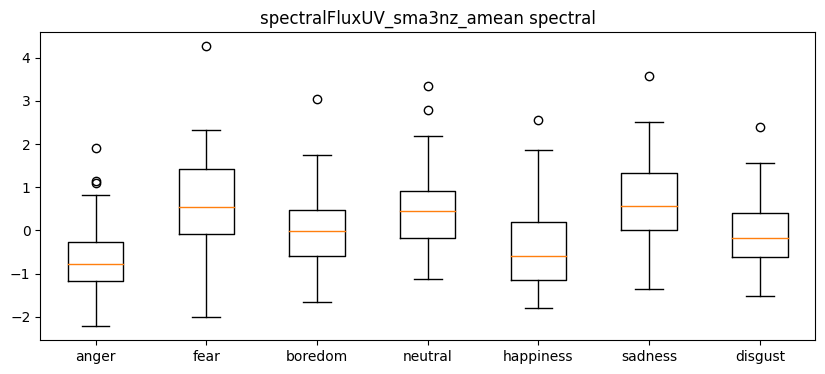

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='darkviolet':
    descriptive_box_plot(i)

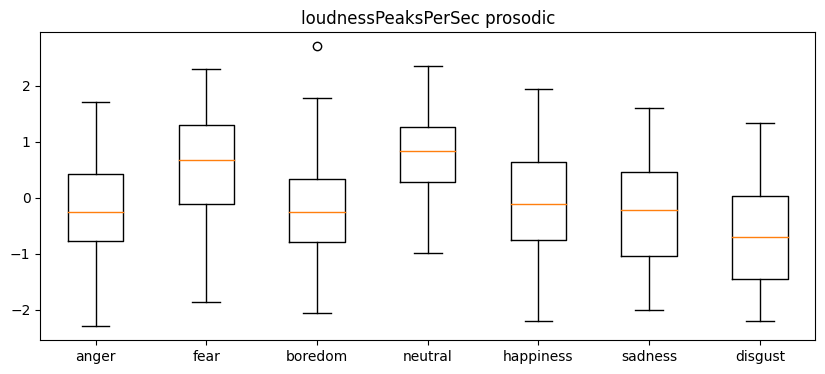

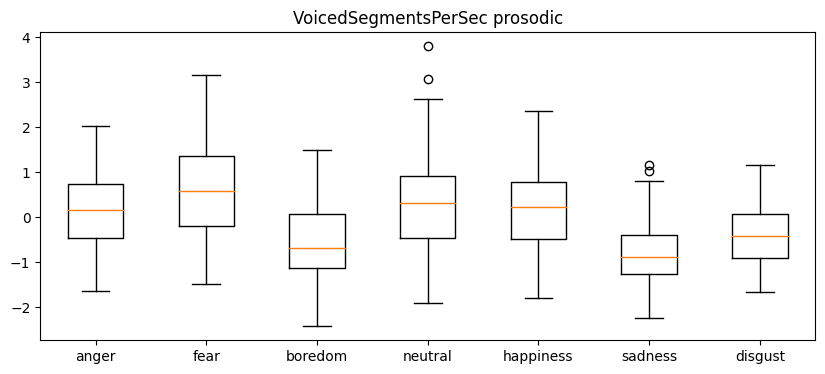

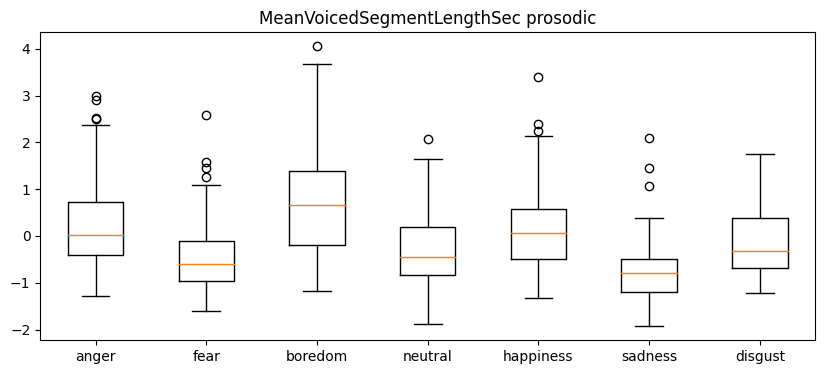

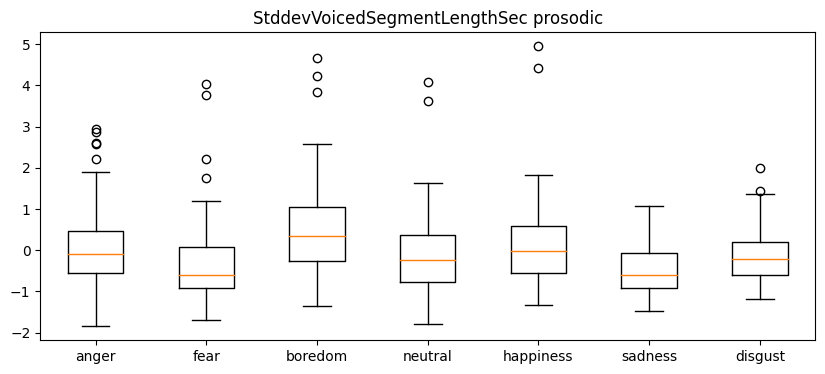

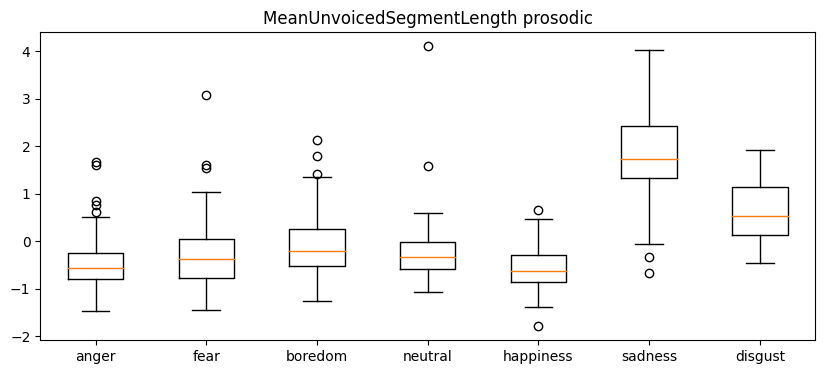

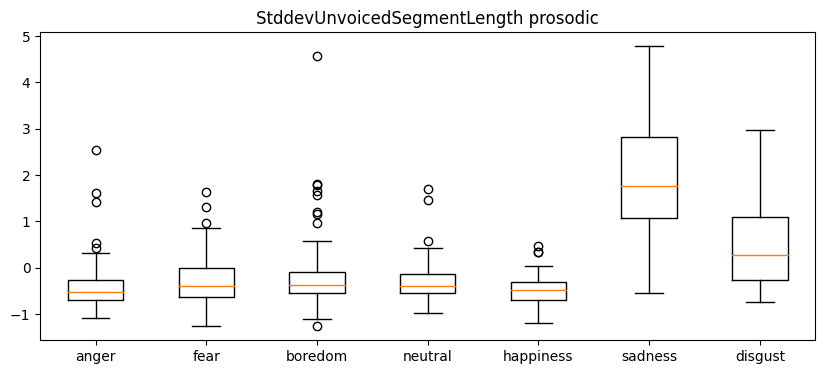

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='slategrey':
    descriptive_box_plot(i)

### Effect size

In [ ]:
def effectsize(dist1, dist2):
  mean1, mean2 = np.mean(dist1), np.mean(dist2)
  std1, std2 = np.std(dist1, ddof=1), np.std(dist2, ddof=1)
  pooled_std = np.sqrt(((len(dist1)-1)*std1**2 + (len(dist2)-1)*std2**2) / (len(dist1) + len(dist2) - 2))
  cohens_d = (mean2 - mean1) / pooled_std
  return cohens_d


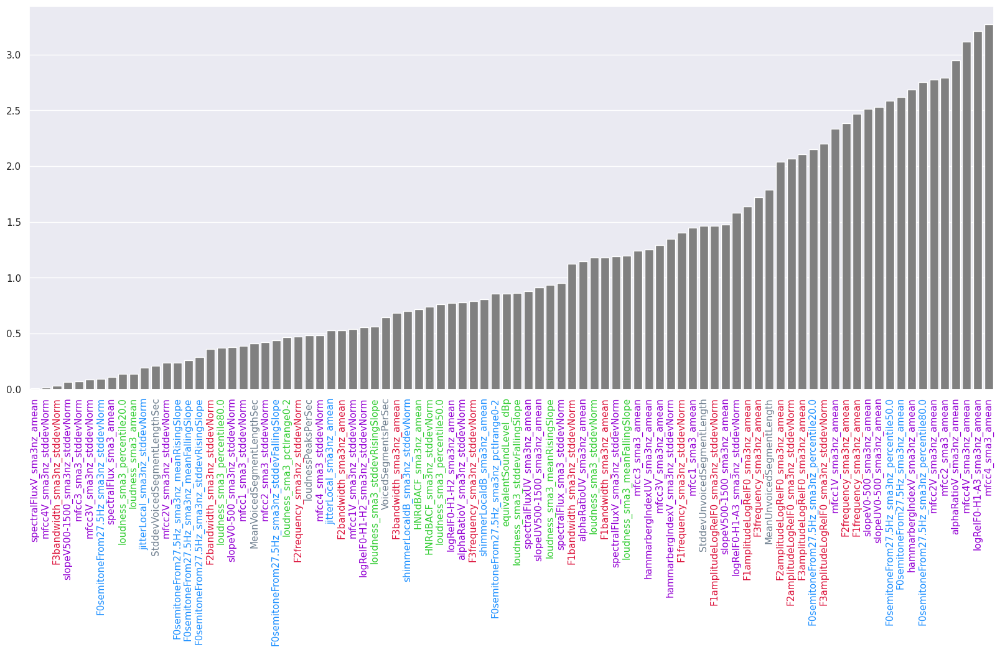

In [ ]:
from scipy import stats

anger_neutral_effect_size_list = []
for i in range(88):
  anger_neutral_effect_size_list.append(abs(effectsize(anger_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=anger_neutral_effect_size_list, sort=True)

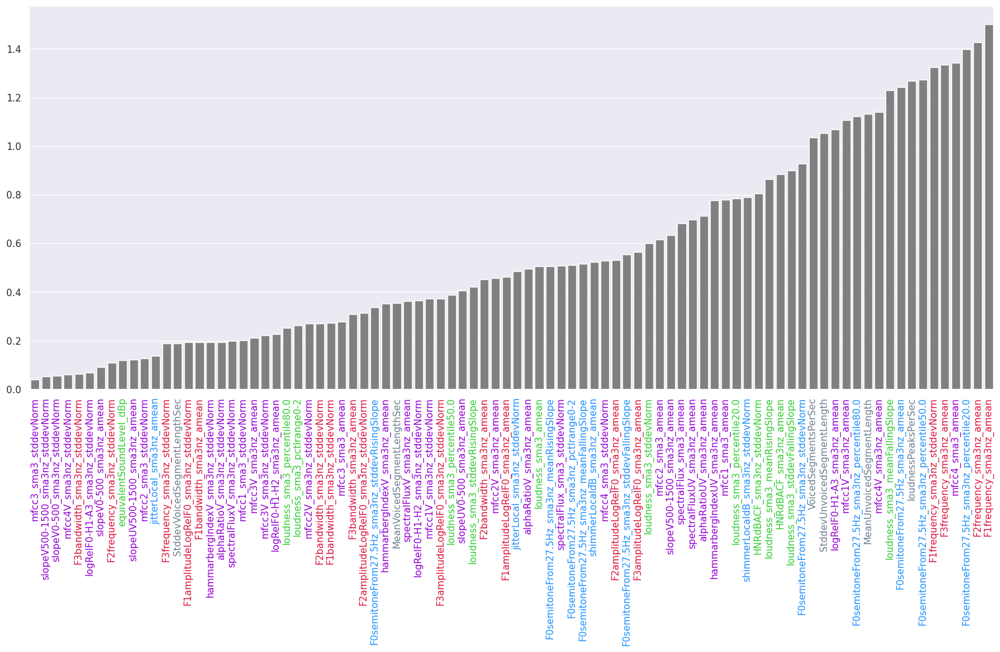

In [ ]:
bored_neutral_effect_size_list = []
for i in range(88):
  bored_neutral_effect_size_list.append(abs(effectsize(bored_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=bored_neutral_effect_size_list, sort=True)

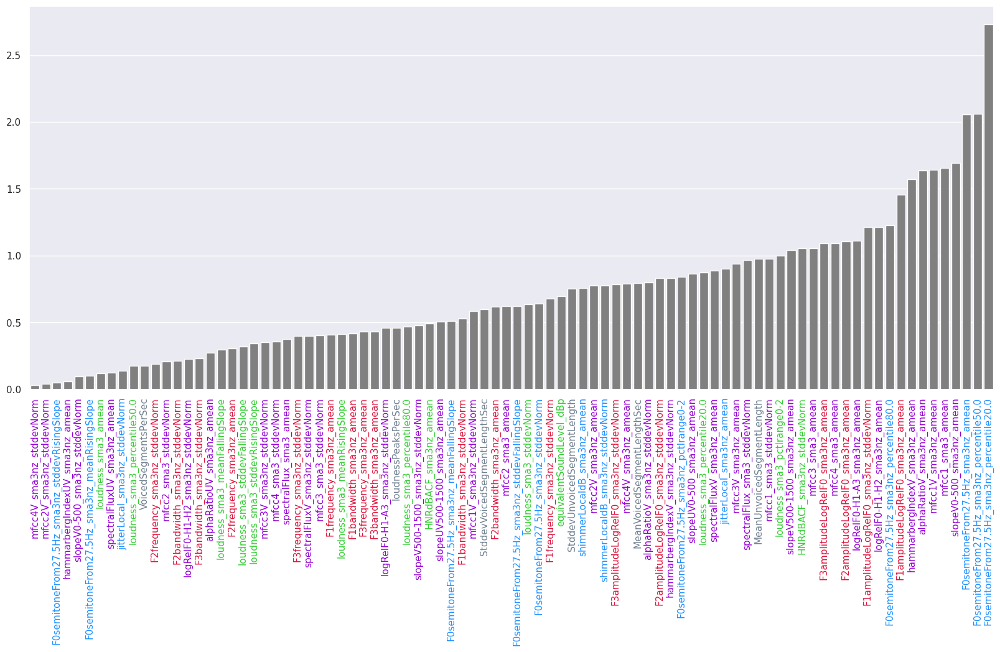

In [ ]:
disgust_neutral_effect_size_list = []
for i in range(88):
  disgust_neutral_effect_size_list.append(abs(effectsize(disgust_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=disgust_neutral_effect_size_list, sort=True)

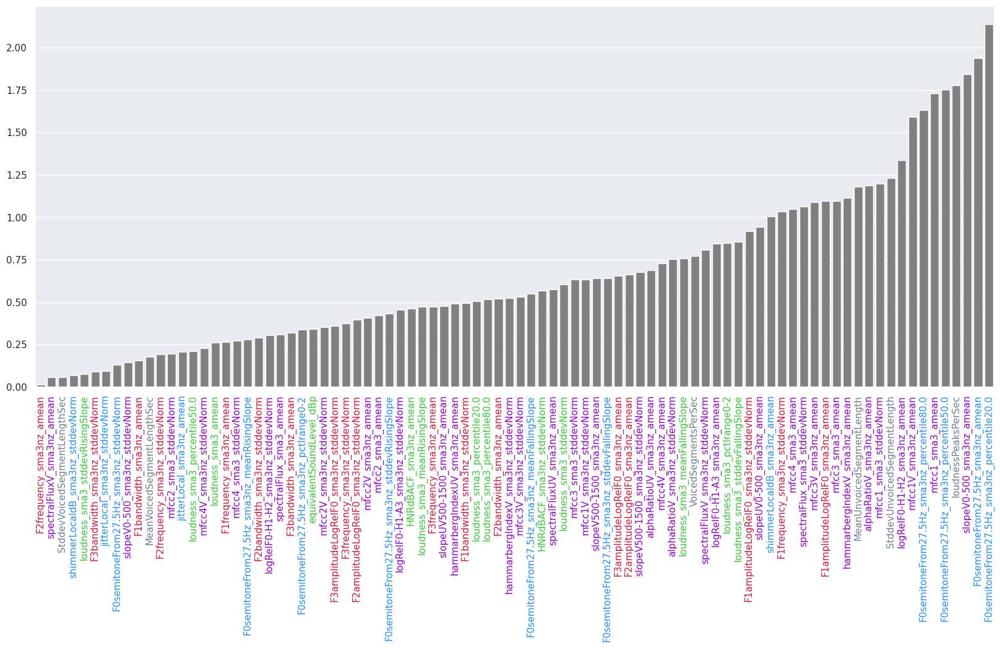

In [ ]:
fear_neutral_effect_size_list = []
for i in range(88):
  fear_neutral_effect_size_list.append(abs(effectsize(fear_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=fear_neutral_effect_size_list, sort=True)

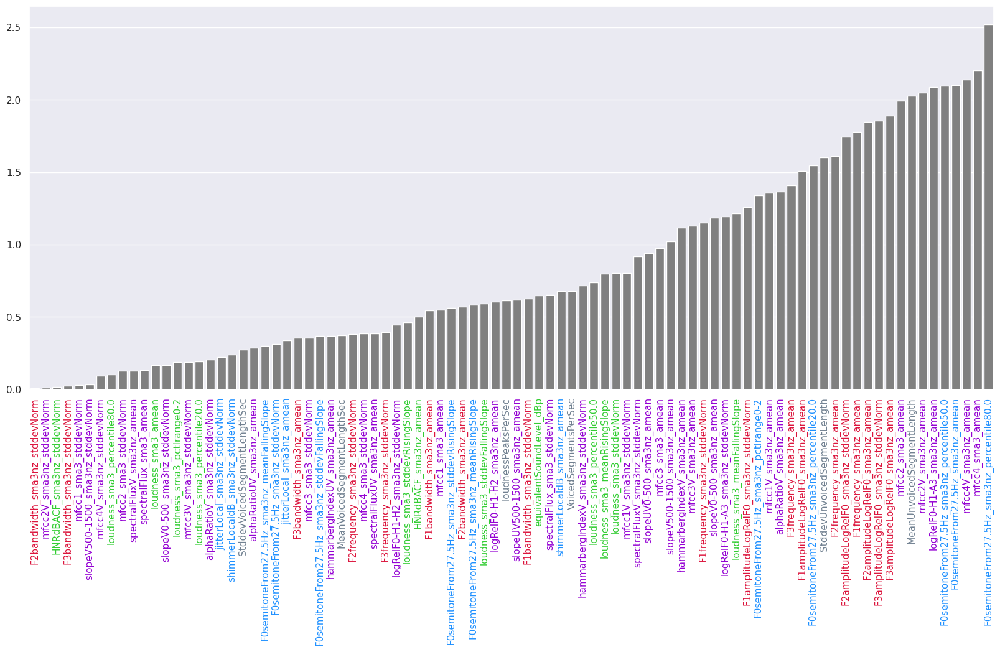

In [ ]:
happy_neutral_effect_size_list = []
for i in range(88):
  happy_neutral_effect_size_list.append(abs(effectsize(happy_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=happy_neutral_effect_size_list, sort=True)

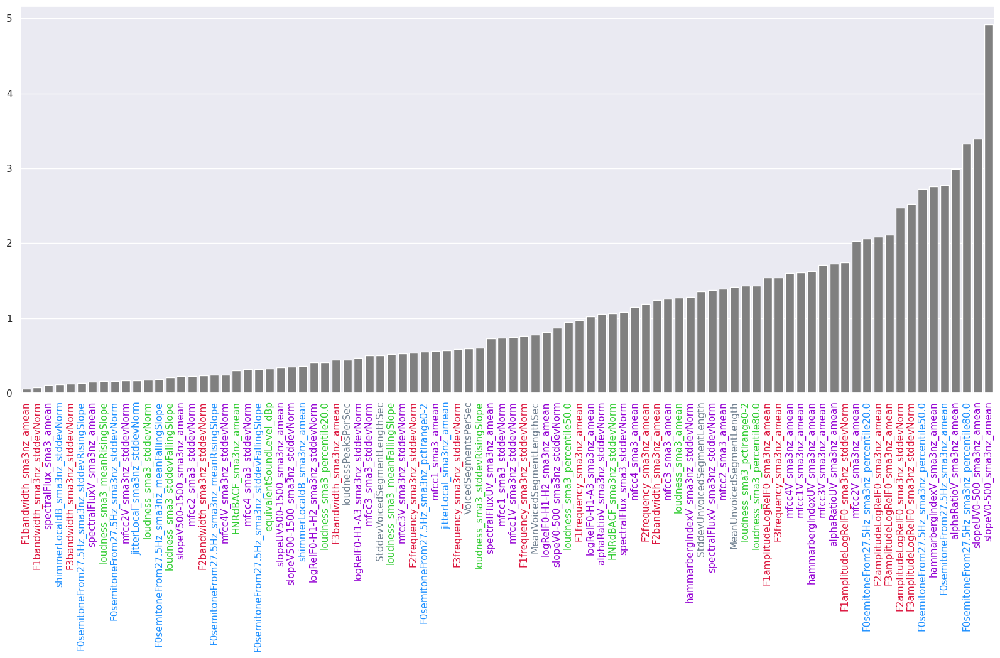

In [ ]:
sad_neutral_effect_size_list = []
for i in range(88):
  sad_neutral_effect_size_list.append(abs(effectsize(sad_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=sad_neutral_effect_size_list, sort=True)